# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

## Importing necessary libraries

In [ ]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
!pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imbalanced-learn==0.10.1 xgboost==2.0.3;

In [ ]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# Libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# To tune model, get different metric scores, and split data
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,
)
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To impute missing values
from sklearn.impute import SimpleImputer
from sklearn import metrics

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To do hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To help with model building
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.impute import SimpleImputer

# To suppress scientific notations
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings

warnings.filterwarnings("ignore")

In [ ]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imblearn==0.12.0 xgboost==2.0.3 -q --user
# !pip install --upgrade -q threadpoolctl

## Loading the dataset

In [ ]:
df = pd.read_csv("BankChurners.csv")

In [ ]:
data = df.copy()

In [ ]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [ ]:
df.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


# Data Overview

- Observations
- Sanity checks

###**Checking the data types of the columns for the dataset**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_


*   We've got 10 integer values fields, 6 object values and 5 float values fields.
*   There are missing values in only two fields: Education_Level (85% complete) and Marital_Status (93% complete).
*   It appears that object type fields are categorical type values.





In [ ]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,NaN,NaN,NaN,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Attrition_Flag,10127,2,Existing Customer,8500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,10127.000,NaN,NaN,NaN,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Gender,10127,2,F,5358,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,10127.000,NaN,NaN,NaN,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Education_Level,8608,6,Graduate,3128,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,9378,3,Married,4687,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,10127,6,Less than $40K,3561,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,10127,4,Blue,9436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,10127.000,NaN,NaN,NaN,35.928,7.986,13.000,31.000,36.000,40.000,56.000




*   On attrition flag, we've got 84% in the category 'existing customer', being imbalanced class like problem for our ML model.
*   Customer Age median and average are almost the same.
*   In gender, 53% of the data is F category.
*   Most of our clients got 2 dependent accounts
*   Most repeated education level reached is graduated, representing the 36% of the available data
*   Most frequent marital status is married representing the 50% of the available data
* There are 6 different categories of income, being less than $40K the most repeated one with 35% of the data.
* Blue represents 93% of the cards categories
* The median and average of the clients have 36 months of relation with the Bank.
* The median and average of the clients have 4 active products with the Bank
* 25% and 50% quartiles on months inactive 12 months are the same, there's something to check there. The same happens on contacts count 12 months.
* The credit limit is highly right skewed.

* Total revolving balance is slightly left skewed.

* Average open to buy is also highly right skewed.

* Total amount change Q4 Q1 mean is almost the same that median.

* Total Transaction Amount is right skewed.

* Total Transaction count is slightly left skewed

* Change in Transaction Count has normal distribution

* The average Utilization Ratio is right skewed.


### **Duplicates Check**

In [ ]:
df.duplicated().sum()

0

### **Checking for missing values**

In [ ]:
round(df.isnull().sum() / df.isnull().count() * 100, 2)

CLIENTNUM                   0.000
Attrition_Flag              0.000
Customer_Age                0.000
Gender                      0.000
Dependent_count             0.000
Education_Level            15.000
Marital_Status              7.400
Income_Category             0.000
Card_Category               0.000
Months_on_book              0.000
Total_Relationship_Count    0.000
Months_Inactive_12_mon      0.000
Contacts_Count_12_mon       0.000
Credit_Limit                0.000
Total_Revolving_Bal         0.000
Avg_Open_To_Buy             0.000
Total_Amt_Chng_Q4_Q1        0.000
Total_Trans_Amt             0.000
Total_Trans_Ct              0.000
Total_Ct_Chng_Q4_Q1         0.000
Avg_Utilization_Ratio       0.000
dtype: float64

* Like the summarized data shows, 15% of `education_level` and 7,4% of `marital_status`, is missing.


## **Checking for missing values on `CLIENTNUM`**

In [ ]:
df['CLIENTNUM'].duplicated().sum()

0

We can see that `clientnum` adds no value, there's no repeated value, so we are going to drop it

In [ ]:
df.drop(["CLIENTNUM"], axis=1, inplace=True)

- I'm going to do the missing value imputation after splitting the data into train, test and validation to avoid data leakage

# Exploratory Data Analysis (EDA)

**Questions that I want to answer, which will lead to a business solution**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?



In [ ]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(df, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=df, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=df, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=df, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        df[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        df[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

**Customer Age**

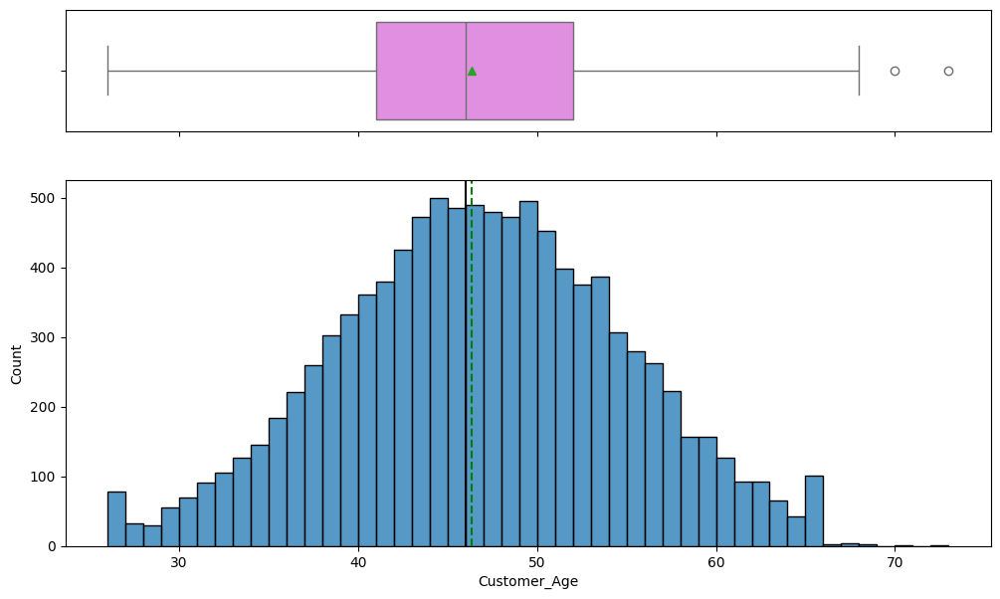

In [ ]:
histogram_boxplot(df,'Customer_Age')



*   Customer Age is normally distributed
*   We got only two outliers, being 73 the age of the oldest customer
*   Median is setted on 46 years.



**Months on Book**


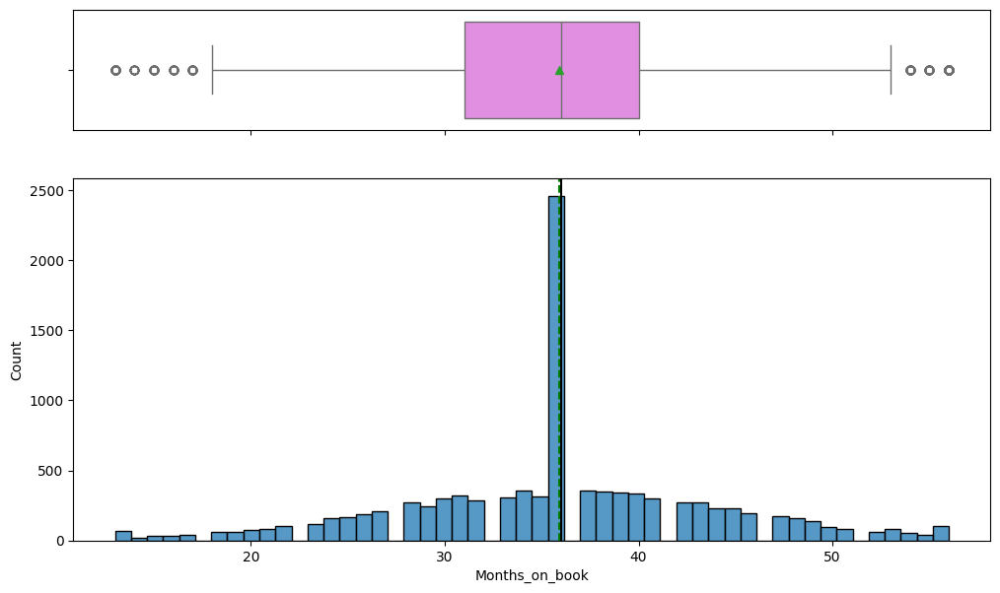

In [ ]:
histogram_boxplot(df,'Months_on_book')



*   Months on book is normally distributed
*   Most of the clients have 3 years of relation with the Bank
* We've got outliers on both sides of the distribution


**Credit Limit**

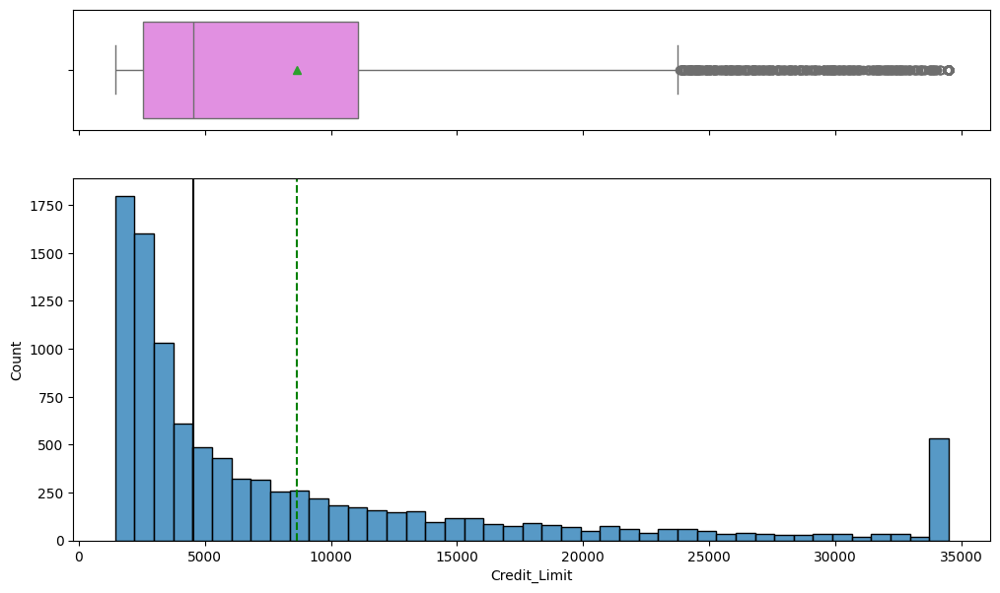

In [ ]:
histogram_boxplot(df,'Credit_Limit')



*   Like the describe table shows us, credit limit is highly right skewed
*   We've got several outliers, starting nearly to $25K
*  Between mean and median there's a huge gap, being the mean almost the double respect the median



**Total Revolving Balance**



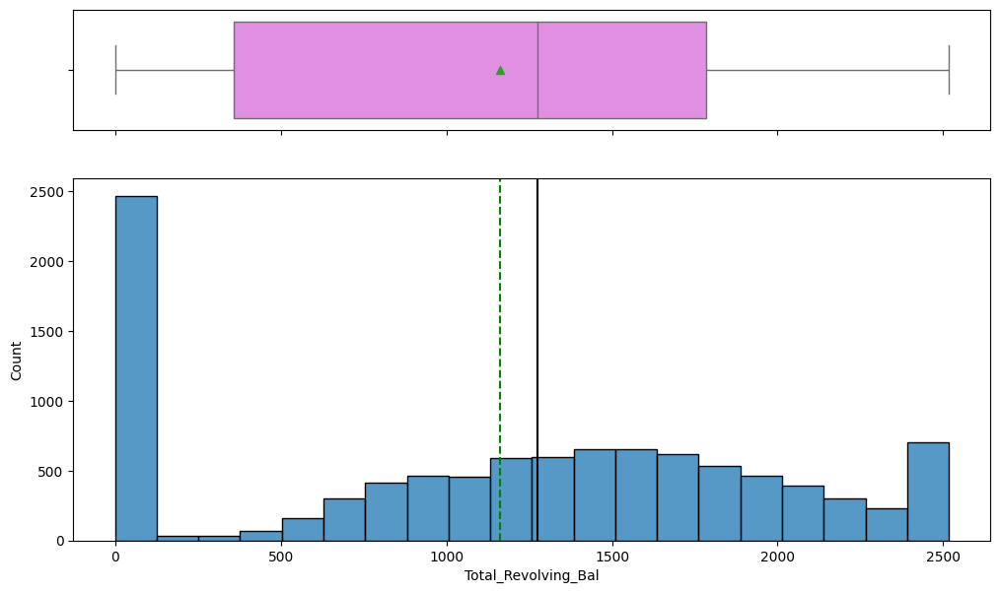

In [ ]:
histogram_boxplot(df,'Total_Revolving_Bal')



*   Seeing describe table looks like the data has a normal distribution with a slight left skew, but histogram shows us that most of the data is concentrated on 0, followed by the other extreme, 2500





**Average Open to Buy**



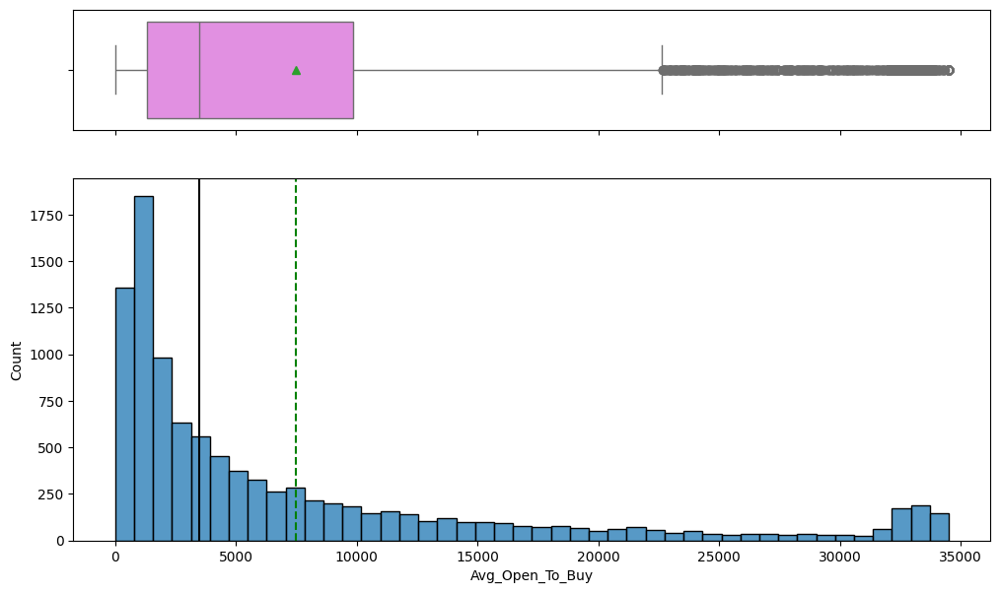

In [ ]:
histogram_boxplot(df,'Avg_Open_To_Buy')



*   Average open to buy is right skewed
*   The graph and info looks pretty similar to Credit Line field





**Change in Transaction Amount**



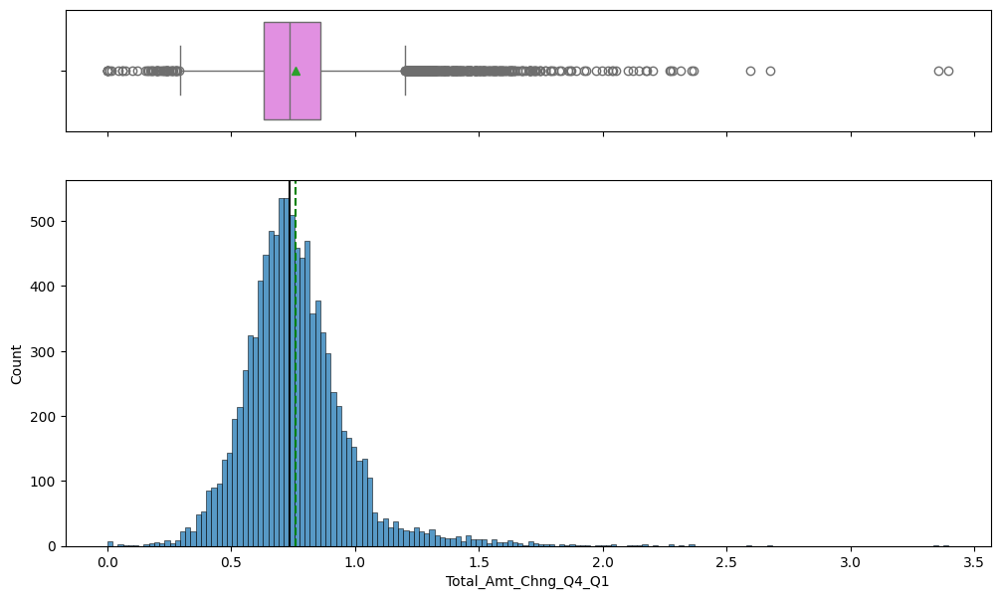

In [ ]:
histogram_boxplot(df,'Total_Amt_Chng_Q4_Q1')



*   Data is highly concentrated between 0.25 and 1.5
*   We've got a lot of outliers on both sides





**Total Transaction Amount**



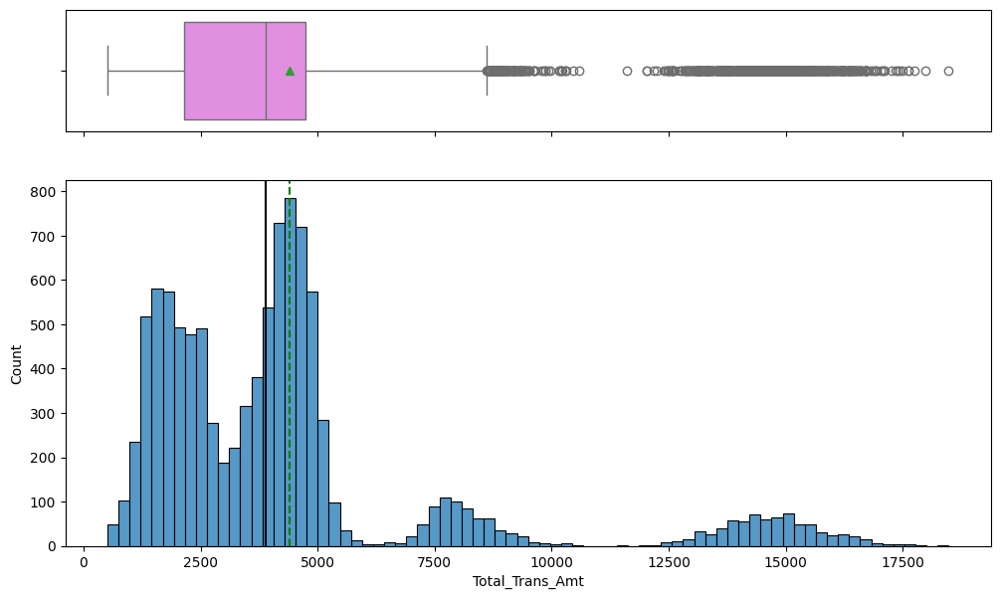

In [ ]:
histogram_boxplot(df,'Total_Trans_Amt')



*   Data is right skewed and we've got a lot of outliers on right whisker, having a peak around $15K



**Total Transaction Count**



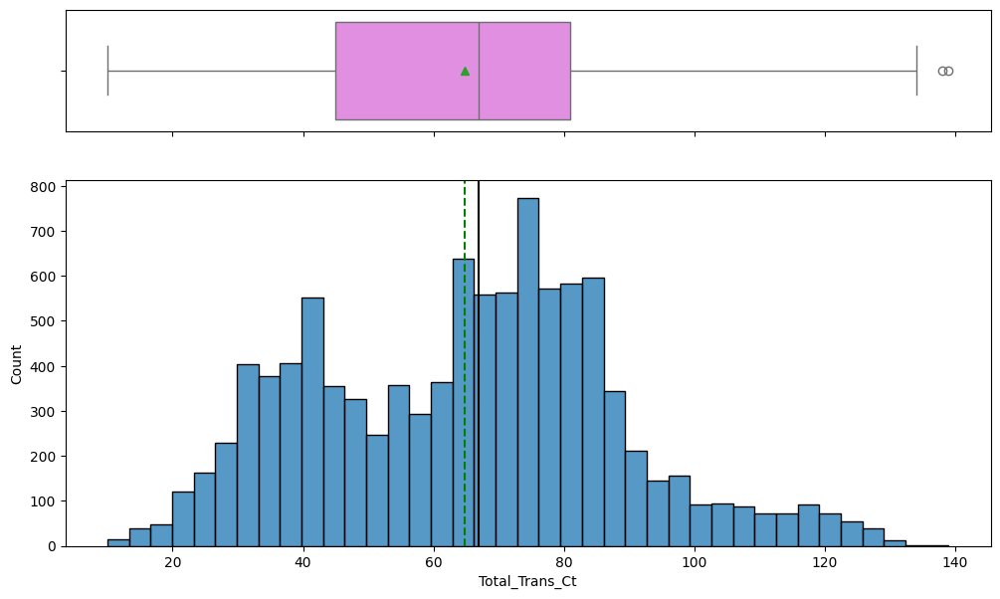

In [ ]:
histogram_boxplot(df,'Total_Trans_Ct')



*   Distribution is almost normal with a slight left skew.
*  We got 2 outliers.





**Change in Transaction Count**



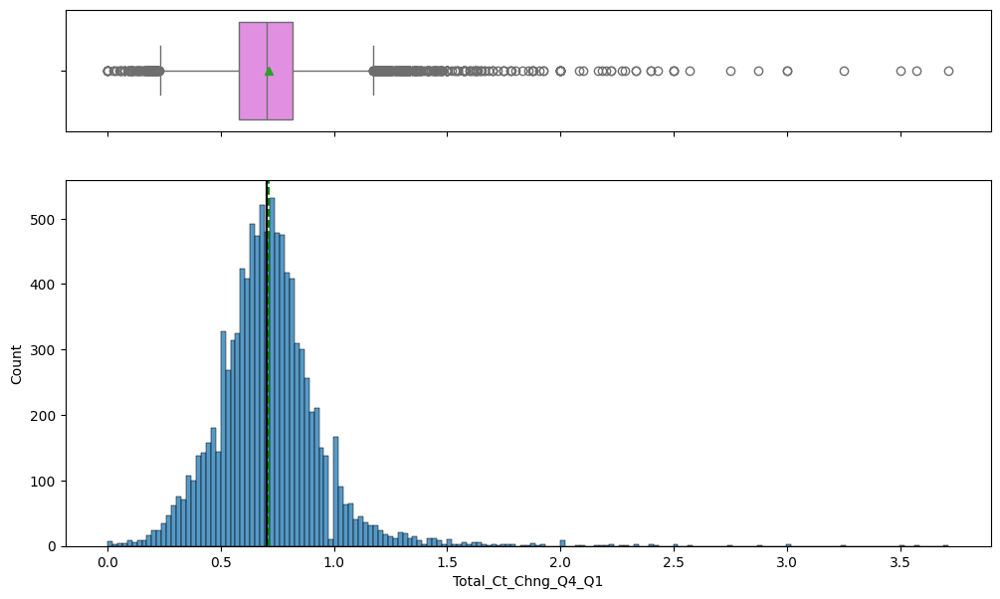

In [ ]:
histogram_boxplot(df,'Total_Ct_Chng_Q4_Q1')



*   Information looks similar to change in transaction amount, being the data focused on the left side and lots of outliers.



In [ ]:
# function to create labeled barplots


def labeled_barplot(df, feature, perc=True, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(df[feature])  # length of the column
    count = df[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=df,
        x=feature,
        palette="Paired",
        order=df[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot



**Attrition Flag**



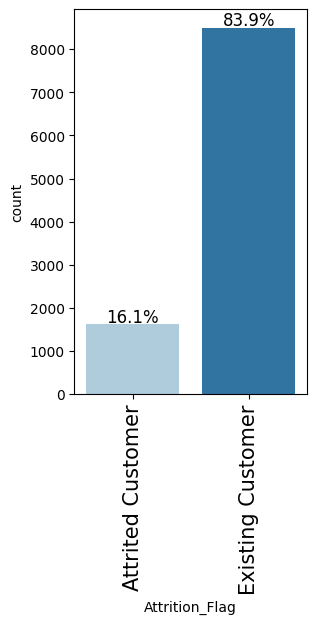

In [ ]:
labeled_barplot (df, 'Attrition_Flag')



*   16,1% of the customers are attrited





**Gender**



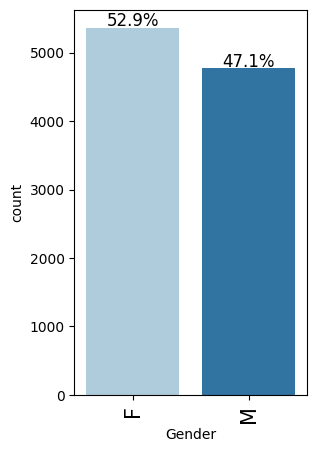

In [ ]:
labeled_barplot (df, 'Gender')



*   Most of the customers our female, but is pretty divided.





**Education Level**



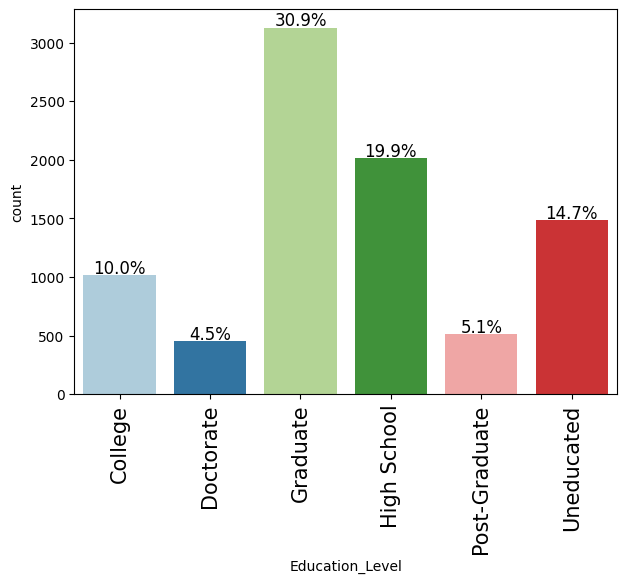

In [ ]:
labeled_barplot (df, 'Education_Level')



*   Most of our customers are graduates, followed by high schoolers and uneducateds.





**Marital Status**



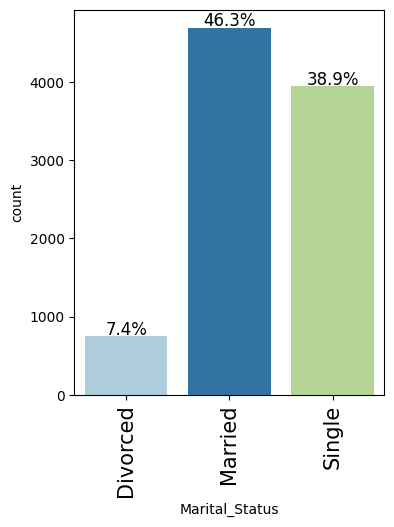

In [ ]:
labeled_barplot (df, 'Marital_Status')

*   Most of our customers are married, followed by singles



**Income Category**



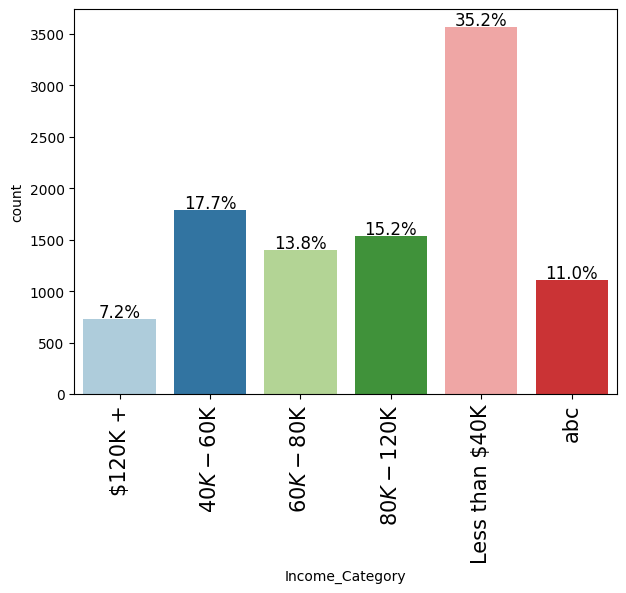

In [ ]:
labeled_barplot (df, 'Income_Category')

*   35% of our customers earns less than $40K

*   53% of customers earns less than $60K



**Card Category**



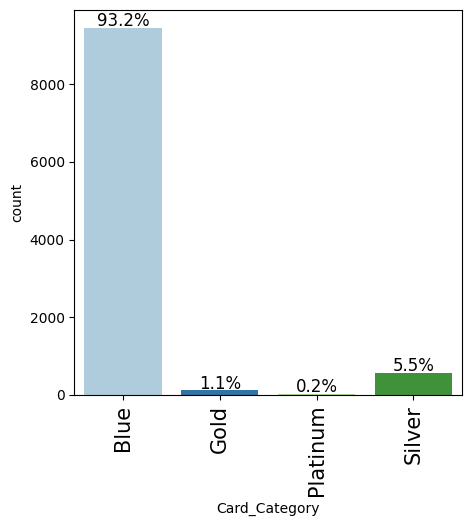

In [ ]:
labeled_barplot (df, 'Card_Category')

*  Only 7% of our customers have other card different from Blue



**Total Relationship Count**



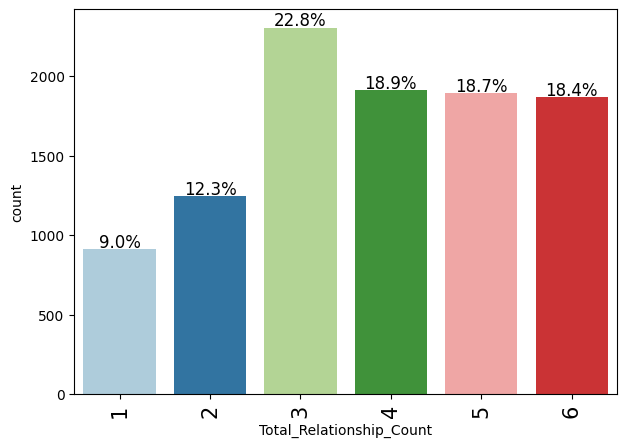

In [ ]:
labeled_barplot (df, 'Total_Relationship_Count')

*  Most of the customers have at least 2 products with the Bank

*  3 is the most common quantity of products with the Bank, followed by 4 and 5. This could suggest that most of the customers are engaged.



**Months Inactive in 12 Months**



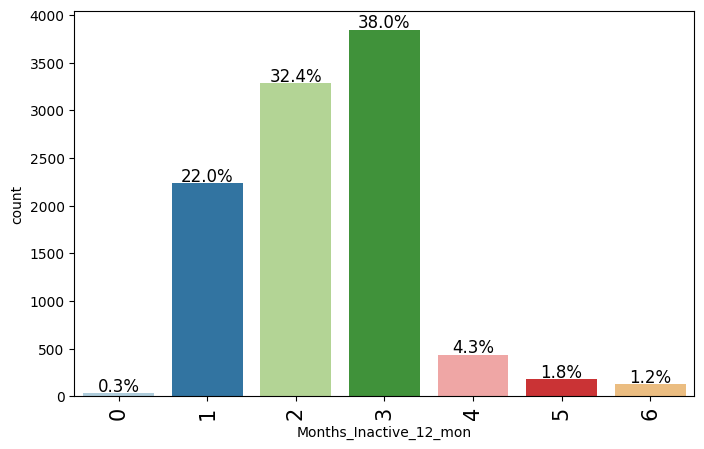

In [ ]:
labeled_barplot (df, 'Months_Inactive_12_mon')

*  Few customers surpases the 4th months of inactivity

*  The concentration of the inactivity is between the 2nd and 3rd month



**Contact Count in 12 Months**



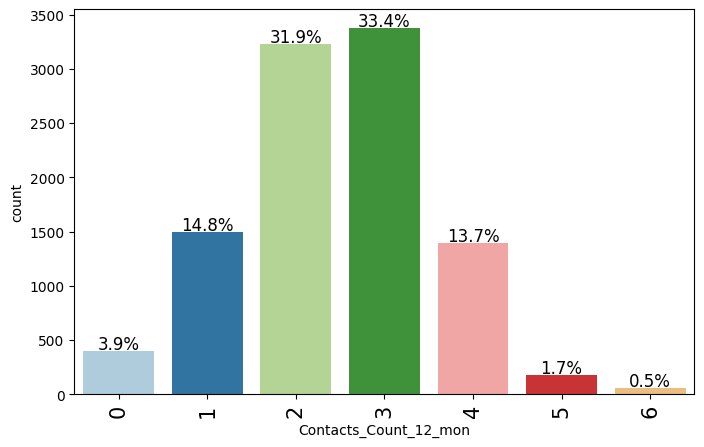

In [ ]:
labeled_barplot (df, 'Contacts_Count_12_mon')

*  Most of the contacts are between the 1st and 4th month

*  The graph is pretty similar to the one from months of inactivity. Later we should investigate on this



**Dependent Count**



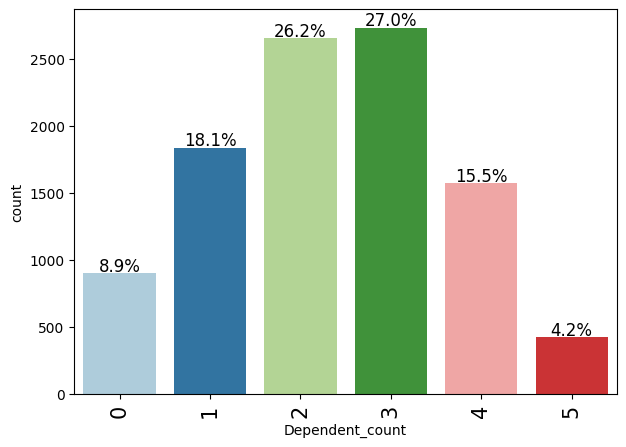

In [ ]:
labeled_barplot (df, 'Dependent_count')

*  68% of the customers have 2 or more dependents

* Only 9% have not dependents


In [ ]:
# function to plot stacked bar chart

def stacked_barplot(df, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = df[predictor].nunique()
    sorter = df[target].value_counts().index[-1]
    tab1 = pd.crosstab(df[predictor], df[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(df[predictor], df[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

## **Bivariate Analysis**

### **Categorical values**

**Customer age relation with Attrition**

Attrition_Flag  Attrited Customer  Existing Customer    All
Customer_Age                                               
All                          1627               8500  10127
43                             85                388    473
48                             85                387    472
44                             84                416    500
46                             82                408    490
45                             79                407    486
49                             79                416    495
47                             76                403    479
41                             76                303    379
50                             71                381    452
54                             69                238    307
40                             64                297    361
42                             62                364    426
53                             59                328    387
52                             58       

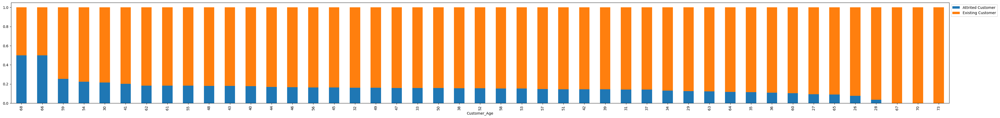

In [ ]:
stacked_barplot(df, 'Customer_Age', 'Attrition_Flag')

* Between forties is the age range where most customers we have.

* Also forties is the age range where most attrited customers exists, nearby to 16%, respecting the value of the whole dataset

* I'm going to check again this plot on the distribution plot to see if we have the same result

**Gender relation with Attrition**

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
All                          1627               8500  10127
F                             930               4428   5358
M                             697               4072   4769
------------------------------------------------------------------------------------------------------------------------


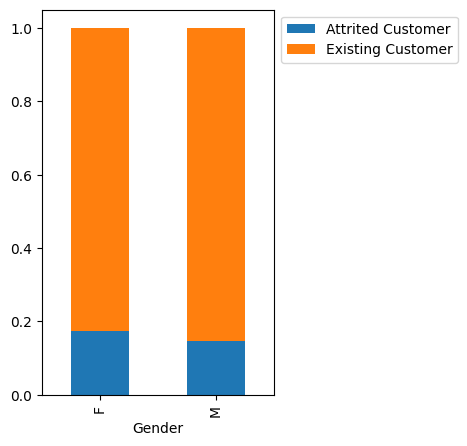

In [ ]:
stacked_barplot(df, 'Gender', 'Attrition_Flag')

* Female customers tend to be more attrited than Male customers

* It appears that gender doesn't explain much about attrition, because the category with most attrited customers doesn't surpases by far the average of the dataset (16%)


**Dependent Count relation with Attrition**

Attrition_Flag   Attrited Customer  Existing Customer    All
Dependent_count                                             
All                           1627               8500  10127
3                              482               2250   2732
2                              417               2238   2655
1                              269               1569   1838
4                              260               1314   1574
0                              135                769    904
5                               64                360    424
------------------------------------------------------------------------------------------------------------------------


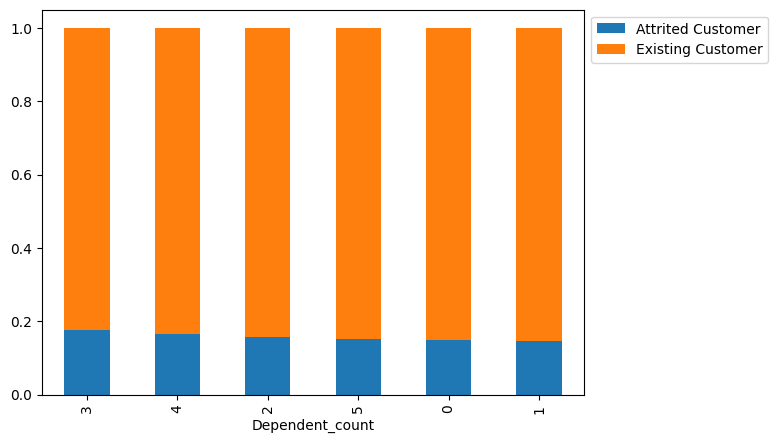

In [ ]:
stacked_barplot(df, 'Dependent_count', 'Attrition_Flag')

* Customers who have more dependents are also the ones who are more attrited, which is pretty extrange because it's expected that they have a stronger relation with the Bank.

* It appears that dependent count doesn't explain much about attrition, because the category with most attrited customers doesn't surpases by far the average of the dataset (16%)


**Education Level relation with Attrition**

Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
All                           1371               7237  8608
Graduate                       487               2641  3128
High School                    306               1707  2013
Uneducated                     237               1250  1487
College                        154                859  1013
Doctorate                       95                356   451
Post-Graduate                   92                424   516
------------------------------------------------------------------------------------------------------------------------


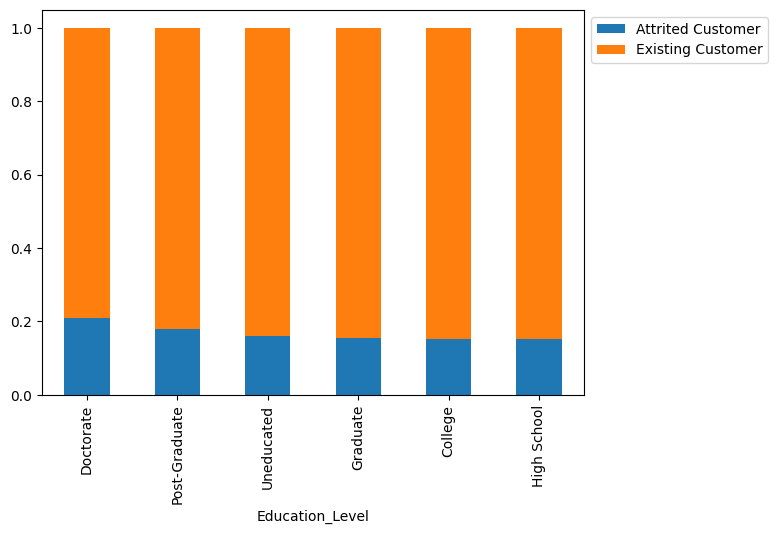

In [ ]:
stacked_barplot(df, 'Education_Level', 'Attrition_Flag')

* Doctorate customers appear to be the ones with more tendency to be attrited, but they also are the smallest group. We can suppose that highly educated people expects better service and are more wealthy, so every Bank will want them.


**Marital Status relation with Attrition**

Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
All                          1498               7880  9378
Married                       709               3978  4687
Single                        668               3275  3943
Divorced                      121                627   748
------------------------------------------------------------------------------------------------------------------------


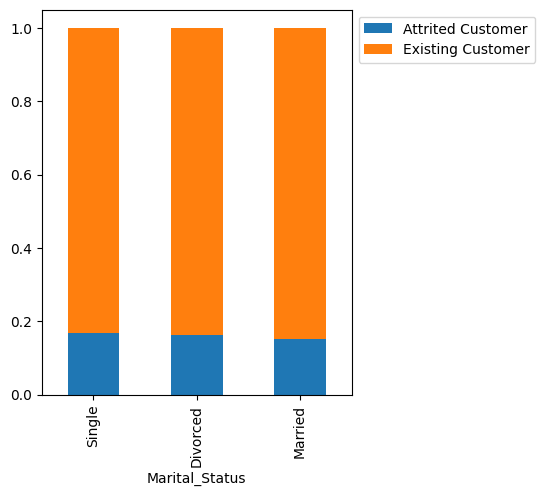

In [ ]:
stacked_barplot(df, 'Marital_Status', 'Attrition_Flag')

* There are no differences between the categories


**Income Category relation with Attrition**

Attrition_Flag   Attrited Customer  Existing Customer    All
Income_Category                                             
All                           1627               8500  10127
Less than $40K                 612               2949   3561
$40K - $60K                    271               1519   1790
$80K - $120K                   242               1293   1535
$60K - $80K                    189               1213   1402
abc                            187                925   1112
$120K +                        126                601    727
------------------------------------------------------------------------------------------------------------------------


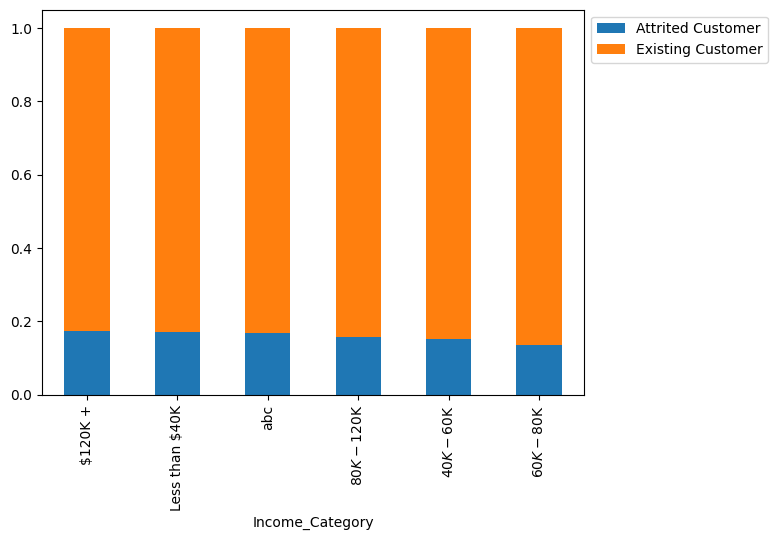

In [ ]:
stacked_barplot(df, 'Income_Category', 'Attrition_Flag')

* Between the highest category attrited ($120+) and the lowest one (60K - 80K), are only 4 porcentual points (pp.)

* This suggest that there's no pattern explained by the income


**Card Category relation with Attrition**

Attrition_Flag  Attrited Customer  Existing Customer    All
Card_Category                                              
All                          1627               8500  10127
Blue                         1519               7917   9436
Silver                         82                473    555
Gold                           21                 95    116
Platinum                        5                 15     20
------------------------------------------------------------------------------------------------------------------------


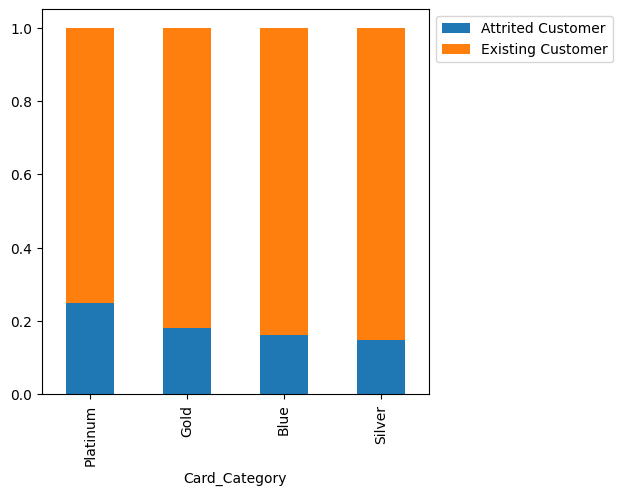

In [ ]:
stacked_barplot(df, 'Card_Category', 'Attrition_Flag')

* Although platinum card category customers are the fewest in the Bank's portfolio, they are the group with most attrited clients followed by gold card, but in a lower percentage.

*   Would be good to check how many doctorate customers are platinum card owners, in order to see if there's any correlation

**Total Relationship Count relation with Attrition**

Attrition_Flag            Attrited Customer  Existing Customer    All
Total_Relationship_Count                                             
All                                    1627               8500  10127
3                                       400               1905   2305
2                                       346                897   1243
1                                       233                677    910
5                                       227               1664   1891
4                                       225               1687   1912
6                                       196               1670   1866
------------------------------------------------------------------------------------------------------------------------


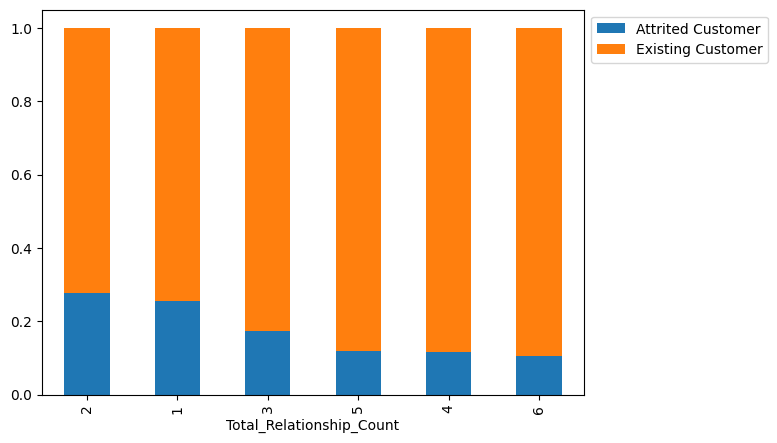

In [ ]:
stacked_barplot(df, 'Total_Relationship_Count', 'Attrition_Flag')

* Customers with fewer products are the ones with more attrition. It seems pretty logical, a customer who is not happy will get no other products.
*   Between 1,2 and 3, we have 60% of the attrited customers.
* Also we can infer that customers who have +4 products are less probable to be attrited

**Months Inactive relation with Attrition**

Attrition_Flag          Attrited Customer  Existing Customer    All
Months_Inactive_12_mon                                             
All                                  1627               8500  10127
3                                     826               3020   3846
2                                     505               2777   3282
4                                     130                305    435
1                                     100               2133   2233
5                                      32                146    178
6                                      19                105    124
0                                      15                 14     29
------------------------------------------------------------------------------------------------------------------------


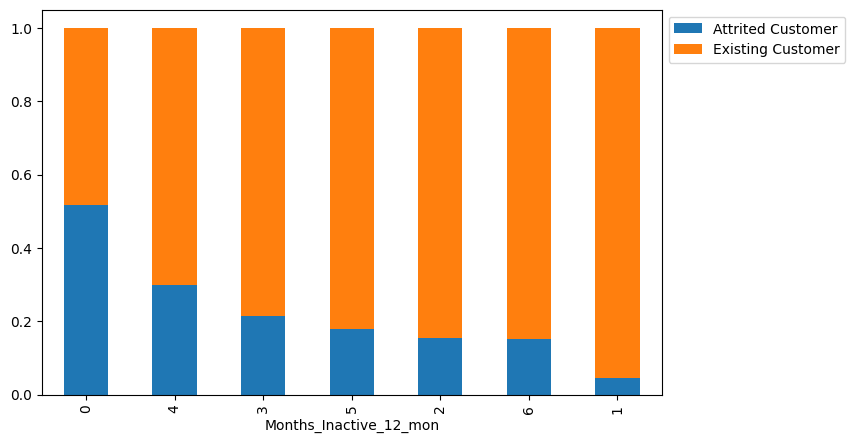

In [ ]:
stacked_barplot(df, 'Months_Inactive_12_mon', 'Attrition_Flag')

* This field shows us some curious information, in an intuitive way it's more probable that customers with more inactivity are the ones which are going to have more attrition, but the ones who have five or six months of inactivity are not the first bars
* Customers with no inactive months are the ones with highest percentage of attrition, but there are only 29 customers from this category (less than 0.01%)


**Contacts Count relation with Attrition**

Attrition_Flag         Attrited Customer  Existing Customer    All
Contacts_Count_12_mon                                             
All                                 1627               8500  10127
3                                    681               2699   3380
2                                    403               2824   3227
4                                    315               1077   1392
1                                    108               1391   1499
5                                     59                117    176
6                                     54                  0     54
0                                      7                392    399
------------------------------------------------------------------------------------------------------------------------


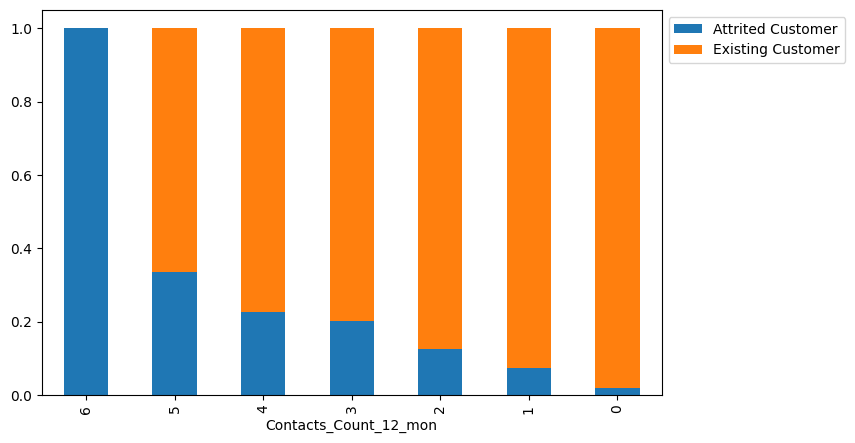

In [ ]:
stacked_barplot(df, 'Contacts_Count_12_mon', 'Attrition_Flag')

* It appears that there's a direct relation between contacts and attrition. Customers who contacts more are the ones with more attrition

### **Now we check continuous values**

In [ ]:
### Function to plot distributions

def distribution_plot_wrt_target(df, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = df[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=df[df[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=df[df[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=df, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=df,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

**Customer age relation with Attrition**

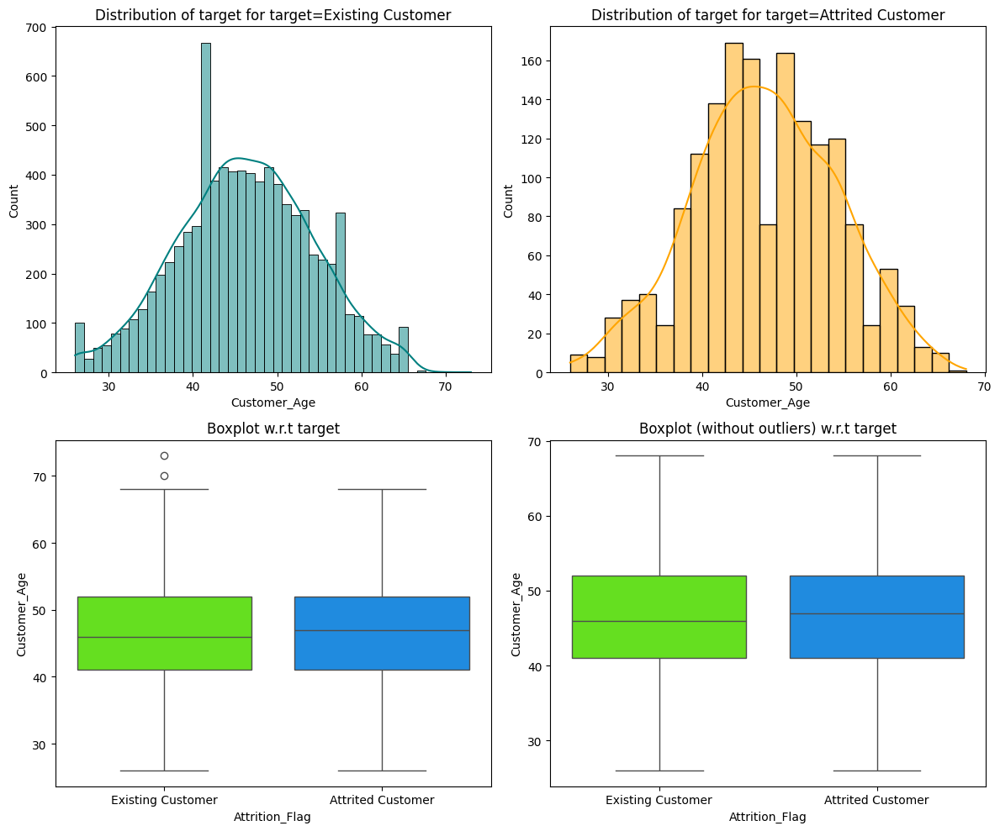

In [ ]:
distribution_plot_wrt_target(df,'Customer_Age', 'Attrition_Flag')

* There's no difference between existing and attrited customers with or without outliers. A priori, age does not explain attrition

**Months on Book relation with Attrition**

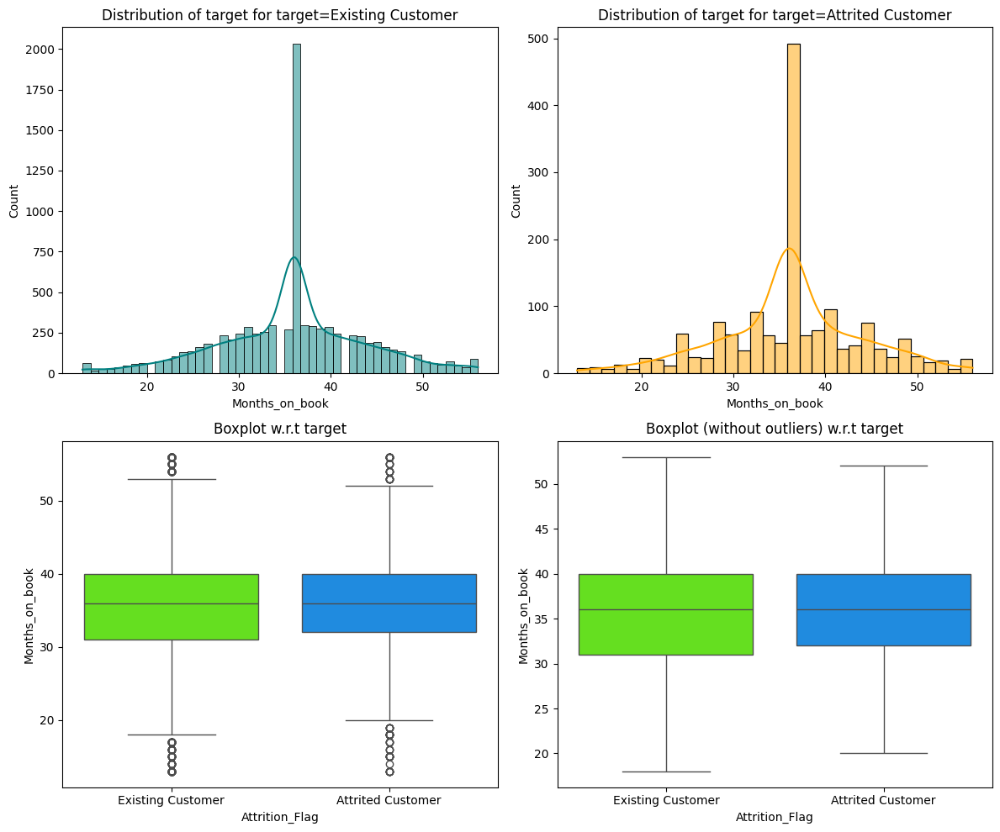

In [ ]:
distribution_plot_wrt_target(df,'Months_on_book', 'Attrition_Flag')

* The concentration of attrited customers is shorter, between ≈ 33 and 40 with respect to existing customers
* Without outliers, the whole distribution of attrited customers is shortly with respect to existing customers

**Total Revolving Balance relation with Attrition**

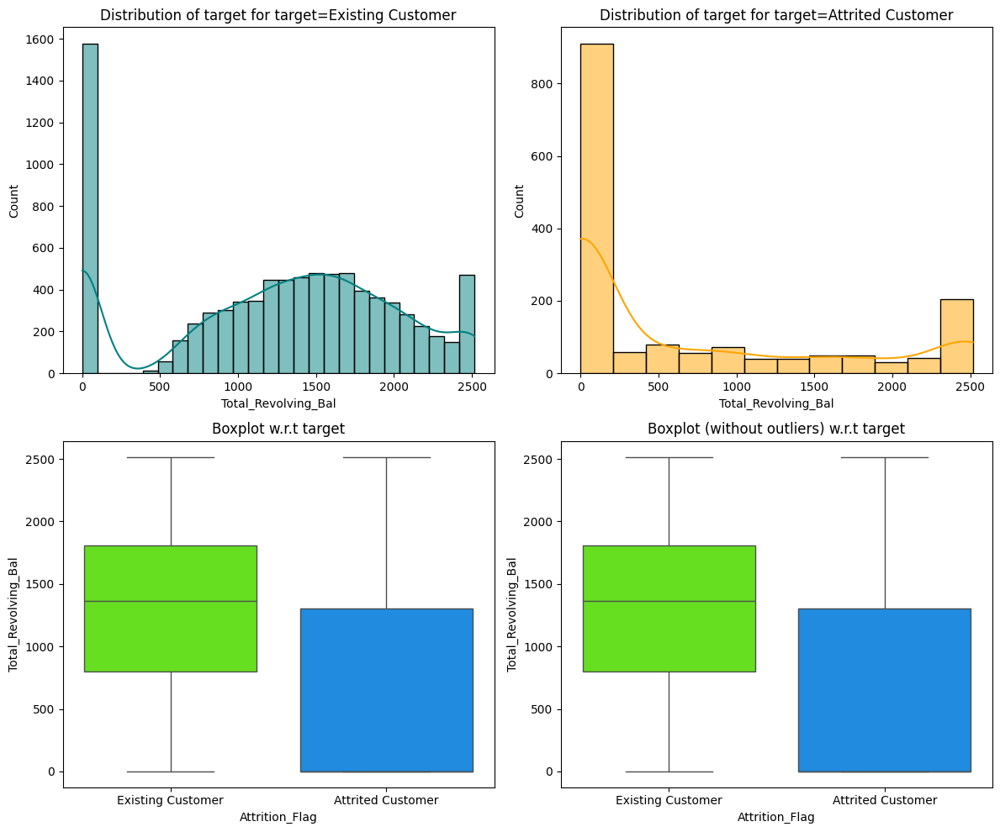

In [ ]:
distribution_plot_wrt_target(df, 'Total_Revolving_Bal', 'Attrition_Flag')



*   Attrited Customers are concentrated under around ≈ 1300
* Mean of existing customers is above the third quartile of attrited customers, which gives us an input to track customers under this line



**Average Open to Buy relation with Attrition**

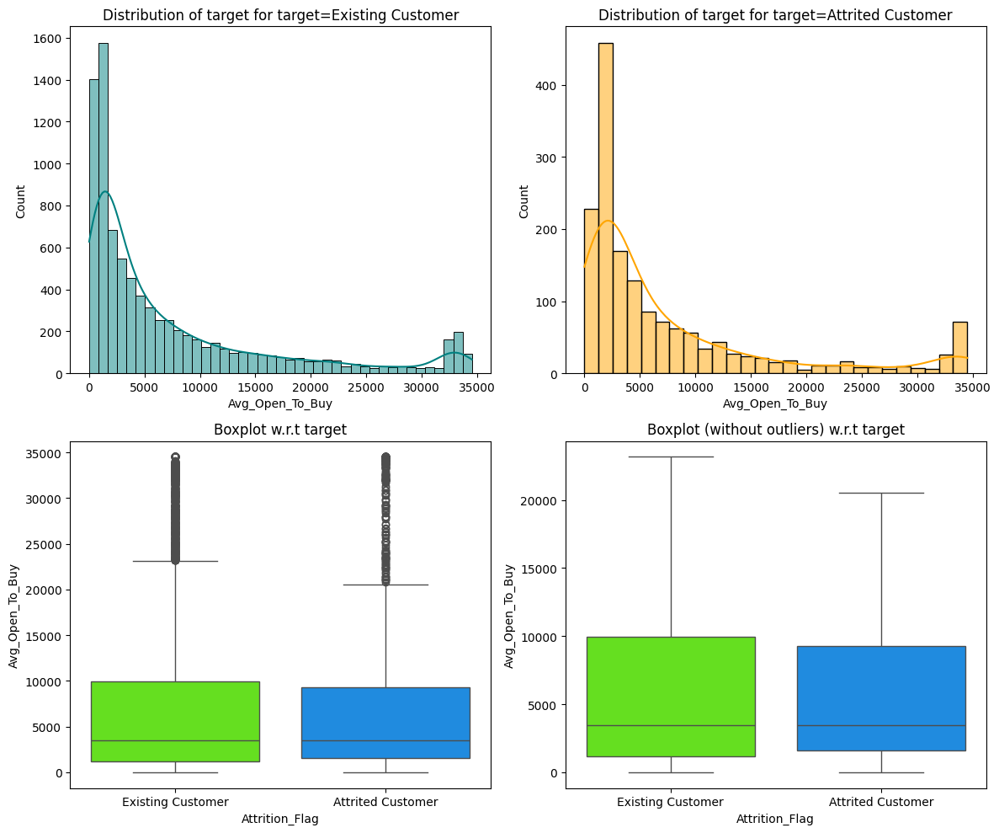

In [ ]:
distribution_plot_wrt_target(df, 'Avg_Open_To_Buy', 'Attrition_Flag')



*   There's not notourious difference between attrtited and existing customers, except for the upper limit of attrited customers, which is a little bit lower than existing customers.



**Change in Transaction Amount relation with Attrition**

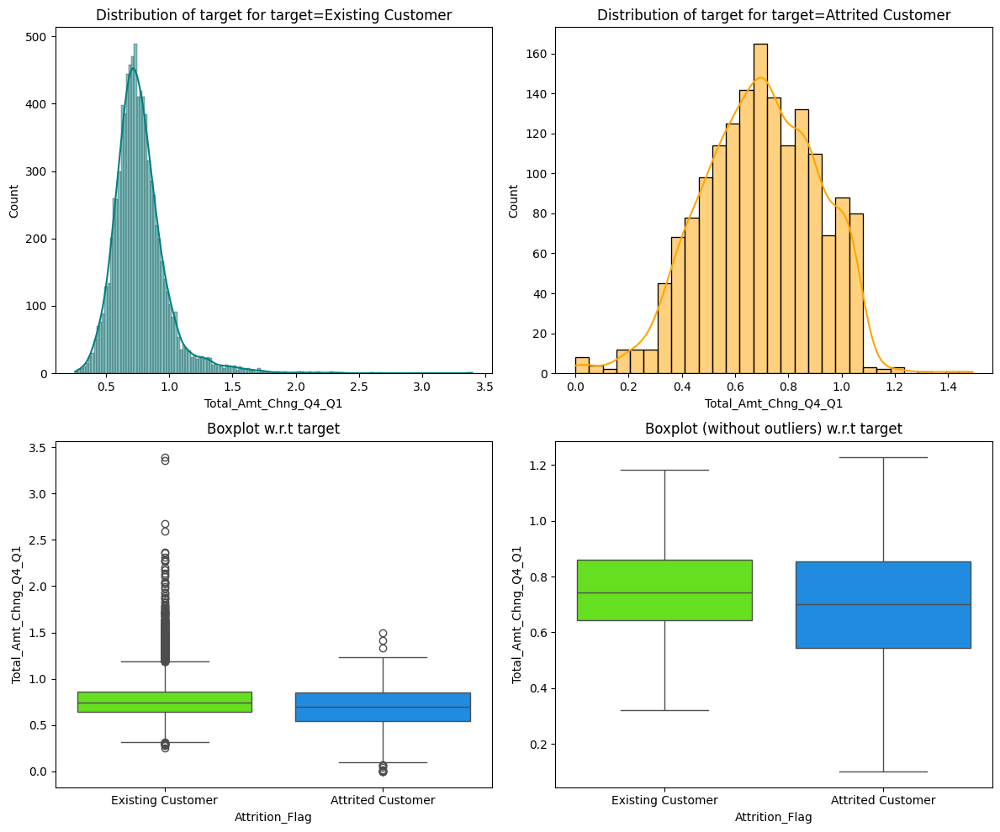

In [ ]:
distribution_plot_wrt_target(df, 'Total_Amt_Chng_Q4_Q1', 'Attrition_Flag')

* On the distribution graph we can see no difference between one or another

*   On the boxplots with outliers attrited customers are concentrated under 0.9 to 0, while in existing costumers the lower limit is 0.4, which gives us an input that customers under that line, probably are attrited




**Total Transaction Amount relation with Attrition**

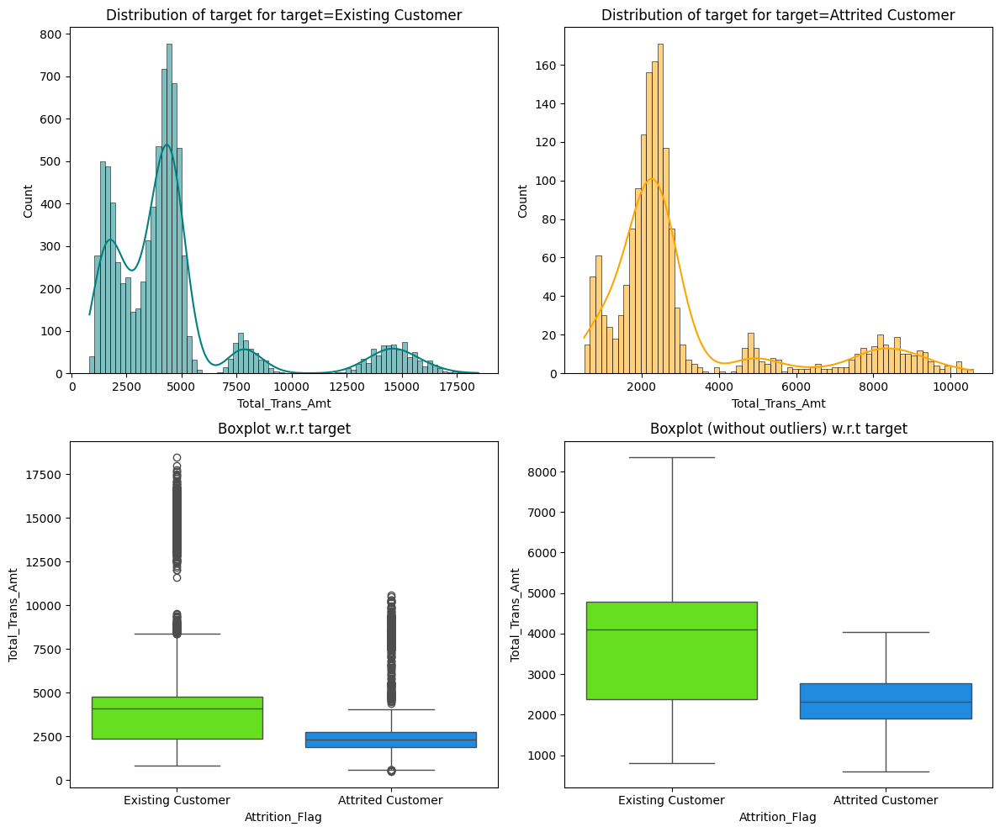

In [ ]:
distribution_plot_wrt_target(df, 'Total_Trans_Amt', 'Attrition_Flag')



*   In the distribution graph there are no attrited customers after 10,000, so we don't have to look out for them
*   It looks like most likely customers to be attrited are under 4,000 on the without outliers boxplot, so we have to track on this customers


**Total Transaction Count relation with Attrition**

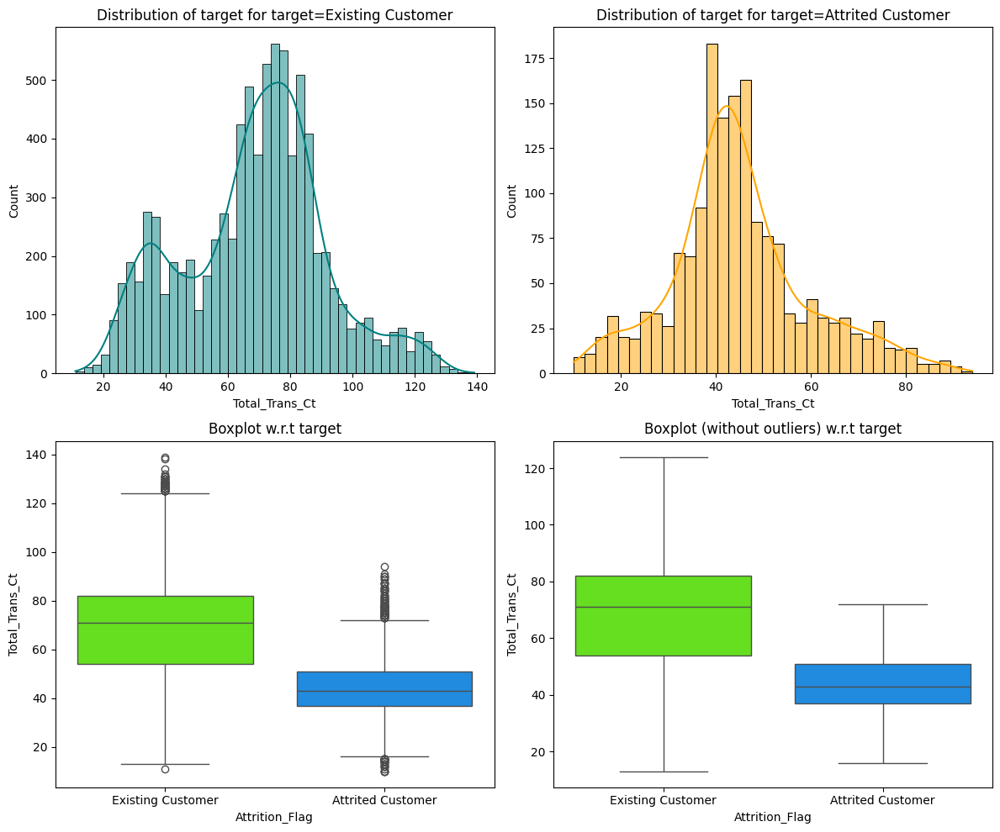

In [ ]:
distribution_plot_wrt_target(df, 'Total_Trans_Ct', 'Attrition_Flag')



*   Here we have a notorious difference between attrited and existing customers.
Most of the attrited customers have under 70 total transactions, so, the Bank have to look for this customers very closely
* Customers who have done over than 100 transactions, are not going to be attrited



**Change in Transaction Count relation with Attrition**

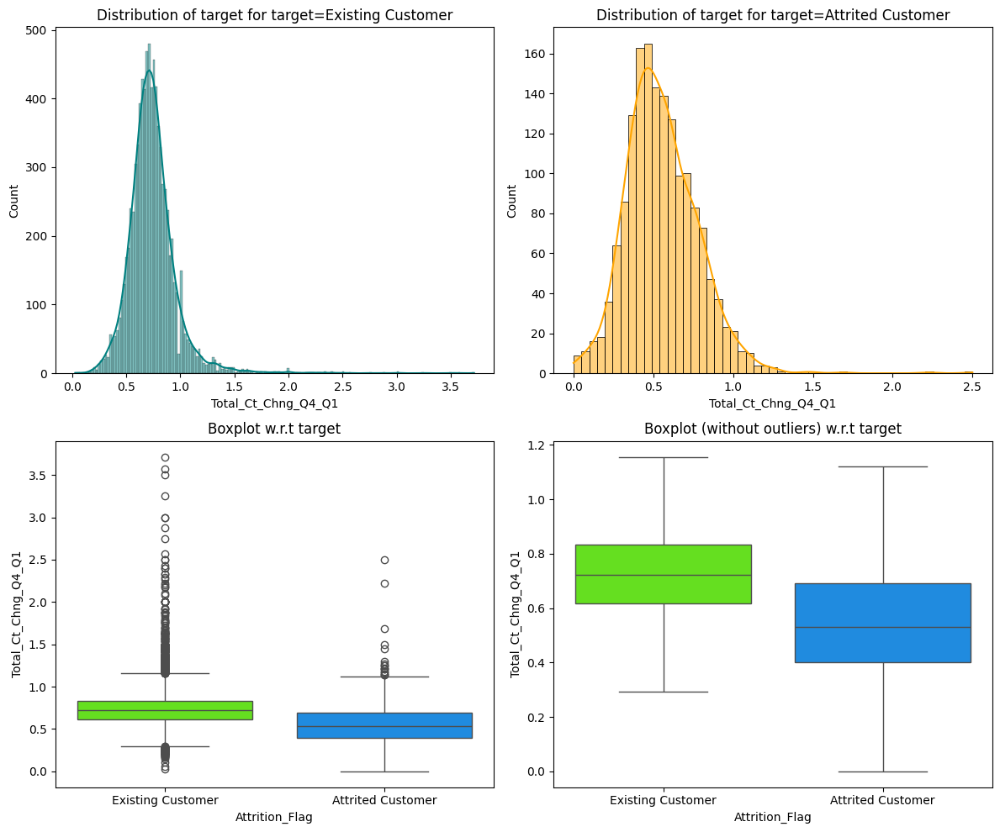

In [ ]:
distribution_plot_wrt_target(df, 'Total_Ct_Chng_Q4_Q1', 'Attrition_Flag')



*   75% of the attrited customers are concentrated under 0.75. It's very important to look on these clients in order to avoid them to be attrited
* Also, customers under 0.3 are all attrited, when this happens we have to do everything to avoid the deregistration



**Average Card Utilization Ratio relation with Attrition**

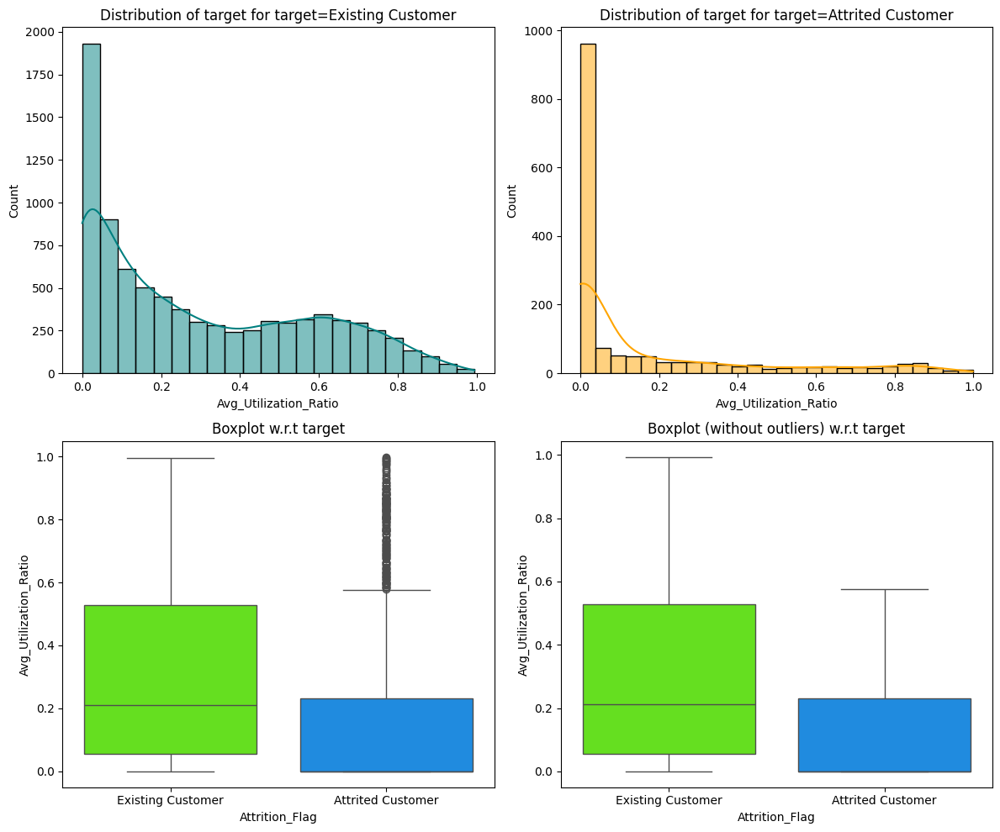

In [ ]:
distribution_plot_wrt_target(df, 'Avg_Utilization_Ratio', 'Attrition_Flag')



*   We can see a big difference here, 75% of attrited customers are concentrated under 0.2 (without outliers boxplot) and above 0.6 are all outliers (outliers plot). This gives us another parameter to be setted to warns the Bank about a possible attrited customer



## **Multivariate Anaysis**

###**Fields transformation**

I'm going to transform the object values into integers in order to use the correlation matrix and the pairplot to check relations

In [ ]:
# Perform one-hot encoding
one_hot_encoded = pd.get_dummies(df[['Gender','Education_Level','Marital_Status','Income_Category','Card_Category', 'Total_Relationship_Count','Months_Inactive_12_mon', 'Contacts_Count_12_mon']], drop_first=True)

# Concatenate the one-hot encoded dataframe with the original dataframe
df_encoded = pd.concat([df, one_hot_encoded], axis=1)

# Drop the original columns that were one-hot encoded
df_encoded.drop(columns=['Gender','Education_Level','Marital_Status','Income_Category','Card_Category', 'Total_Relationship_Count','Months_Inactive_12_mon', 'Contacts_Count_12_mon'], inplace=True)

In [ ]:
df_encoded["Attrition_Flag"].replace('Existing Customer', 0, inplace=True)
df_encoded["Attrition_Flag"].replace('Attrited Customer', 1, inplace=True)

In [ ]:
df_encoded["Attrition_Flag"].unique()

array([0, 1])

In [ ]:
df_encoded.head()

,Attrition_Flag,Customer_Age,Dependent_count,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_abc,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,0,45,3,39,12691.000,777,11914.000,1.335,1144,42,1.625,0.061,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0
1,0,49,5,44,8256.000,864,7392.000,1.541,1291,33,3.714,0.105,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0
2,0,51,3,36,3418.000,0,3418.000,2.594,1887,20,2.333,0.000,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
3,0,40,4,34,3313.000,2517,796.000,1.405,1171,20,2.333,0.760,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
4,0,40,3,21,4716.000,0,4716.000,2.175,816,28,2.500,0.000,1,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0


###**Heatmap**

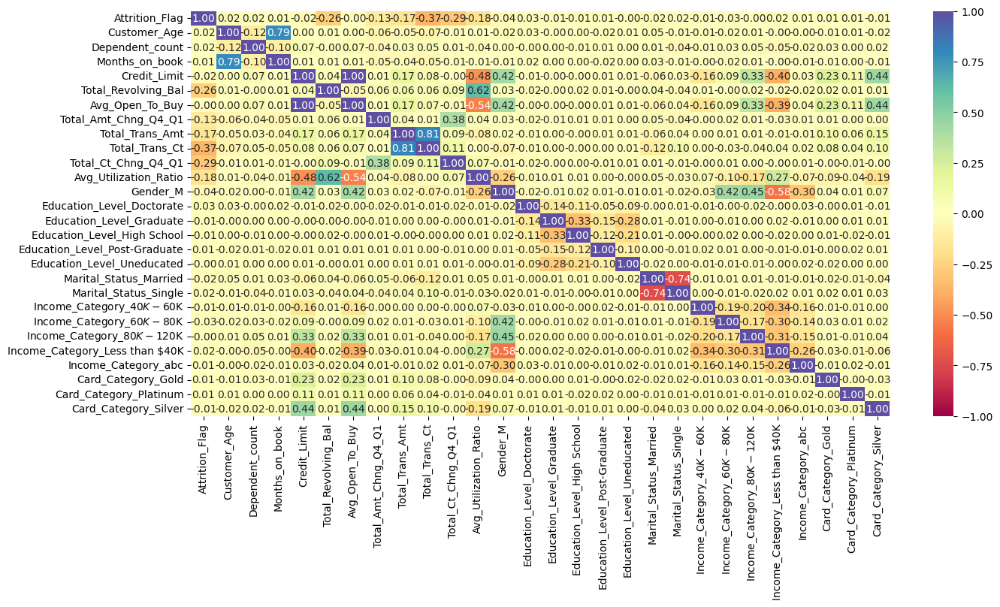

In [ ]:
plt.figure(figsize=(15, 7))
sns.heatmap(df_encoded.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

There aren't many correlated fields, but there are a few to highlight:

*	Months on book and Customer Age have a high correlation
*	Credit limit is slightly correlated with average utilization ratio. Also total revolving balance it's a little bit more correlated to average utilization ratio. And average open to buy is slightly negatively correlated to average utilization ratio
*	Income category less than $40K is negatively correlated masculine gender


### **Pairplot**

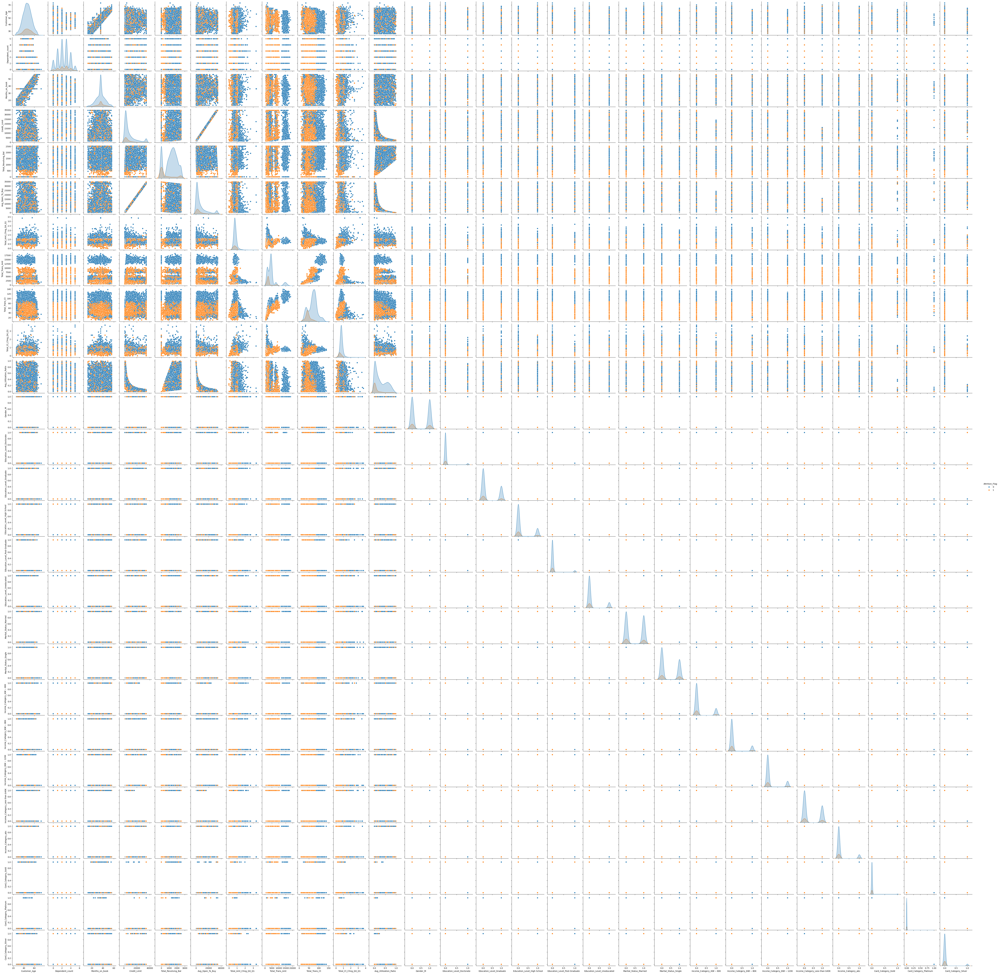

In [ ]:
sns.pairplot(df_encoded, hue='Attrition_Flag');


Looking rapidly to the pairplot, we can see some patterns respect to our target data:

*	On total transaction amount attrited customers concentrates under 10,000, and also there's a gap till 12,500 which are all existing customers, this gave us an input that customers don't uses the Bank so much.

*	The same happens on Total Transaction Count, attrited customers are concentrated under 80, besides in both cases are also existing customers in these range

*	We can see also a similar pattern on Change in Transaction Count, attrited customers are from 1.0 to 0.0




## Data Pre-processing

In [ ]:
gender = {"F": 0, "M": 1}
df["Gender"] = df["Gender"].map(gender)

education = {"Graduate": 0, "High School": 1, "Uneducated": 2, "College": 3, "Post-Graduate": 4, "Doctorate": 5}
df["Education_Level"] = df["Education_Level"].map(education)

marital = {
    "Divorced": 0,
    "Married": 1,
    "Single": 2
    }
df["Marital_Status"] = df["Marital_Status"].map(marital)

income = {
    "Less than $40K": 0,
    "$40K - $60K": 1,
    "$80K - $120K": 2,
    "$60K - $80K": 3,
    "abc": 4,
    "$120K +": 5
}
df["Income_Category"] = df["Income_Category"].map(income)

card = {
    "Blue": 0,
    "Gold": 1,
    "Platinum": 2,
    "Silver": 3,
}
df["Card_Category"] = df["Card_Category"].map(card)



* We've already encoded the different categorical values, which can leads us to build our model. Now I'll split the data into train, test and validation to avoid data leakage

In [ ]:
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,1,3,1.000,1.000,3,0,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,Existing Customer,49,0,5,0.000,2.000,0,0,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,Existing Customer,51,1,3,0.000,1.000,2,0,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,Existing Customer,40,0,4,1.000,NaN,0,0,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,Existing Customer,40,1,3,2.000,1.000,3,0,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [ ]:
X = df.drop(["Attrition_Flag"], axis=1)
y = df["Attrition_Flag"].apply(lambda x: 1 if x == "Attrited Customer" else 0)

In [ ]:
# Splitting data into training, validation and test set:
# first we split data into 2 parts, say temporary and test

X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y
)

# then we split the temporary set into train and validation

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp
)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 19) (2026, 19) (2026, 19)


## Missing value imputation




In [ ]:
df.isnull().sum()

Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [ ]:
# Get list of categorical and numerical columns
cols = list(X_train.select_dtypes(include=['int', 'float']).columns)

#Imputing
num_imputer = SimpleImputer(strategy='mean')
X_train[cols] = num_imputer.fit_transform(X_train[cols])
X_val[cols] = num_imputer.transform(X_val[cols])
X_test[cols] = num_imputer.transform(X_test[cols])

In [ ]:
X_train.isnull().sum()

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
X_val.isnull().sum()

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
X_test.isnull().sum()

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64



*   All missing values have been treated.
*   Now that we have all in number terms, we advance with the model.


### Reverse Mapping for Encoded Variables

In [ ]:
## Function to inverse the encoding
def inverse_mapping(x, y):
    inv_dict = {v: k for k, v in x.items()}
    X_train[y] = np.round(X_train[y]).map(inv_dict).astype("category")
    X_val[y] = np.round(X_val[y]).map(inv_dict).astype("category")
    X_test[y] = np.round(X_test[y]).map(inv_dict).astype("category")

In [ ]:
inverse_mapping(gender, "Gender")
inverse_mapping(education, "Education_Level")
inverse_mapping(marital, "Marital_Status")
inverse_mapping(income, "Income_Category")
inverse_mapping(card, "Card_Category")

* Checking inverse mapped values/categories.

#### `Train Dataset`

In [ ]:
cols = X_train.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_train[i].value_counts())
    print("*" * 30)

F    3193
M    2882
Name: Gender, dtype: int64
******************************
High School      2156
Graduate         1854
Uneducated        881
College           618
Post-Graduate     312
Doctorate         254
Name: Education_Level, dtype: int64
******************************
Married     3276
Single      2369
Divorced     430
Name: Marital_Status, dtype: int64
******************************
Less than $40K    2129
$40K - $60K       1059
$80K - $120K       953
$60K - $80K        831
abc                654
$120K +            449
Name: Income_Category, dtype: int64
******************************
Blue        5655
Silver       339
Gold          69
Platinum      12
Name: Card_Category, dtype: int64
******************************


#### `Validation Dataset`

In [ ]:
cols = X_val.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_val[i].value_counts())
    print("*" * 30)

F    1095
M     931
Name: Gender, dtype: int64
******************************
High School      698
Graduate         623
Uneducated       306
College          199
Post-Graduate    101
Doctorate         99
Name: Education_Level, dtype: int64
******************************
Married     1100
Single       770
Divorced     156
Name: Marital_Status, dtype: int64
******************************
Less than $40K    736
$40K - $60K       361
$80K - $120K      293
$60K - $80K       279
abc               221
$120K +           136
Name: Income_Category, dtype: int64
******************************
Blue        1905
Silver        97
Gold          21
Platinum       3
Name: Card_Category, dtype: int64
******************************


#### `Test Dataset`

In [ ]:
cols = X_test.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_test[i].value_counts())
    print("*" * 30)

F    1070
M     956
Name: Gender, dtype: int64
******************************
High School      678
Graduate         651
Uneducated       300
College          196
Post-Graduate    103
Doctorate         98
Name: Education_Level, dtype: int64
******************************
Married     1060
Single       804
Divorced     162
Name: Marital_Status, dtype: int64
******************************
Less than $40K    696
$40K - $60K       370
$60K - $80K       292
$80K - $120K      289
abc               237
$120K +           142
Name: Income_Category, dtype: int64
******************************
Blue        1876
Silver       119
Gold          26
Platinum       5
Name: Card_Category, dtype: int64
******************************


* Inverse mapping returned original labels.

### Creating Dummy Variables

In [ ]:
X_train = pd.get_dummies(X_train, drop_first=True)
X_val = pd.get_dummies(X_val, drop_first=True)
X_test = pd.get_dummies(X_test, drop_first=True)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 30) (2026, 30) (2026, 30)


In [ ]:
X_train.head()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_abc,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
800,40.000,2.000,21.000,6.000,4.000,3.000,20056.000,1602.000,18454.000,0.466,1687.000,46.000,0.533,0.080,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
498,44.000,1.000,34.000,6.000,2.000,0.000,2885.000,1895.000,990.000,0.387,1366.000,31.000,0.632,0.657,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0
4356,48.000,4.000,36.000,5.000,1.000,2.000,6798.000,2517.000,4281.000,0.873,4327.000,79.000,0.881,0.370,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0
407,41.000,2.000,36.000,6.000,2.000,0.000,27000.000,0.000,27000.000,0.610,1209.000,39.000,0.300,0.000,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1
8728,46.000,4.000,36.000,2.000,2.000,3.000,15034.000,1356.000,13678.000,0.754,7737.000,84.000,0.750,0.090,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1


* After encoding there are 30 columns.

## Model Building

### Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model.
- False negatives (FN) are real failures in a generator where there is no detection by model.
- False positives (FP) are failure detections in a generator where there is no failure.

**Which metric to optimize?**

* We need to choose the metric which will ensure that the maximum number of generator failures are predicted correctly by the model.
* We would want Recall to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
* We want to minimize false negatives because if a model predicts that a machine will have no failure when there will be a failure, it will increase the maintenance cost.

**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

### Model Building with original data

Sample code for model building with original data

In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("XGB", XGBClassifier(random_state=1, eval_metric='logloss')))
##'_______' ## Complete the code to append remaining 3 models in the list models

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Bagging: 0.9836065573770492
Random forest: 1.0
GBM: 0.8770491803278688
Adaboost: 0.826844262295082
dtree: 1.0
XGB: 1.0

Validation Performance:

Bagging: 0.8159509202453987
Random forest: 0.7852760736196319
GBM: 0.8588957055214724
Adaboost: 0.852760736196319
dtree: 0.7883435582822086
XGB: 0.8895705521472392


- XGB has the best performance followed by GBM as per the validation performance

### Model Building with Oversampled data


In [ ]:
print("Before Oversampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Oversampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

print("After Oversampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After Oversampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))


print("After Oversampling, the shape of train_X: {}".format(X_train_over.shape))
print("After Oversampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before Oversampling, counts of label 'Yes': 976
Before Oversampling, counts of label 'No': 5099 

After Oversampling, counts of label 'Yes': 5099
After Oversampling, counts of label 'No': 5099 

After Oversampling, the shape of train_X: (10198, 30)
After Oversampling, the shape of train_y: (10198,) 



In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("XGB", XGBClassifier(random_state=1, eval_metric='logloss')))
##'_______' ## Complete the code to append remaining 3 models in the list models

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Bagging: 0.9980388311433614
Random forest: 1.0
GBM: 0.9817611296332615
Adaboost: 0.9676407138654638
dtree: 1.0
XGB: 1.0

Validation Performance:

Bagging: 0.8282208588957055
Random forest: 0.8282208588957055
GBM: 0.8865030674846626
Adaboost: 0.8558282208588958
dtree: 0.8159509202453987
XGB: 0.901840490797546


- XGB has the best performance followed by Adaboost model and GBM as per the validation performance

### Model Building with Undersampled data

In [ ]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [ ]:
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))

Before Under Sampling, counts of label 'Yes': 976
Before Under Sampling, counts of label 'No': 5099 

After Under Sampling, counts of label 'Yes': 976
After Under Sampling, counts of label 'No': 976 

After Under Sampling, the shape of train_X: (1952, 30)
After Under Sampling, the shape of train_y: (1952,) 



In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(base_estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'), random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1, class_weight='balanced')))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("XGB", XGBClassifier(random_state=1, eval_metric='logloss')))


print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Training Performance:

Bagging: 0.992827868852459
Random forest: 1.0
GBM: 0.9795081967213115
Adaboost: 0.9528688524590164
dtree: 1.0
XGB: 1.0

Validation Performance:

Bagging: 0.9294478527607362
Random forest: 0.9294478527607362
GBM: 0.9601226993865031
Adaboost: 0.9601226993865031
dtree: 0.9049079754601227
XGB: 0.9723926380368099


- XGB has the best performance followed by Adaboost model and GBM as per the validation performance

- Best performance models till now are XGB, Adaboost model and GBM, exhibing great performance on training and validation
- Now we are going to check with the Hyperparameter Tuning.

# HyperparameterTuning

#### Sample Parameter Grids

- For Gradient Boosting:

```
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}
```

- For Adaboost:

```
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
```

- For Bagging Classifier:

```
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}
```
- For Random Forest:

```
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}
```

- For Decision Trees:

```
param_grid = {
    'max_depth': np.arange(2,6),
    'min_samples_leaf': [1, 4, 7],
    'max_leaf_nodes' : [10, 15],
    'min_impurity_decrease': [0.0001,0.001]
}
```

- For XGBoost (optional):

```
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}
```

## **Bagging with original data**

In [ ]:
%%time
# defining model
Model = BaggingClassifier(base_estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'),random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
              }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 70, 'max_samples': 0.9, 'max_features': 0.9} with CV score=0.7960491889063317:
CPU times: user 4.02 s, sys: 361 ms, total: 4.38 s
Wall time: 55.4 s


In [ ]:
tuned_bag = BaggingClassifier(
    base_estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'),
    random_state=1,
    n_estimators = 70,
    max_samples = 0.9,
    max_features = 0.9,
)
tuned_bag.fit(X_train, y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                        random_state=1),
                  max_features=0.9, max_samples=0.9, n_estimators=70,
                  random_state=1)

In [ ]:
# Checking model's performance on training set
bag_train = model_performance_classification_sklearn(tuned_bag, X_train, y_train)
bag_train

,Accuracy,Recall,Precision,F1
0,1.000,0.999,1.000,0.999


In [ ]:
# Checking model's performance on validation set
bag_val = model_performance_classification_sklearn(tuned_bag, X_val, y_val)
bag_val

,Accuracy,Recall,Precision,F1
0,0.956,0.810,0.904,0.854


## **Bagging with Oversampled Data**

In [ ]:
%%time
# defining model
Model = BaggingClassifier(base_estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'),random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    'max_samples': [0.9 ,0.95, 0.905, 0.99],
    'max_features': [0.9 ,0.95, 0.905, 0.99],
    'n_estimators' : [70, 75, 80, 90, 99],
              }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over,y_train_over)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 75, 'max_samples': 0.95, 'max_features': 0.905} with CV score=0.9611753160538014:
CPU times: user 11.1 s, sys: 612 ms, total: 11.7 s
Wall time: 4min 36s


In [ ]:
tuned_bag_o = BaggingClassifier(
    base_estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'),
    random_state=1,
    n_estimators = 99,
    max_samples = 0.99,
    max_features = 0.95,
)
tuned_bag_o.fit(X_train_over, y_train_over)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                        random_state=1),
                  max_features=0.95, max_samples=0.99, n_estimators=99,
                  random_state=1)

In [ ]:
# Checking model's performance on training set
bag_o_train = model_performance_classification_sklearn(tuned_bag_o, X_train_over, y_train_over)
bag_o_train

,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [ ]:
# Checking model's performance on validation set
bag_o_val = model_performance_classification_sklearn(tuned_bag_o, X_val, y_val)
bag_o_val

,Accuracy,Recall,Precision,F1
0,0.954,0.887,0.838,0.861


## **Bagging with undersampled data**

In [ ]:
# defining model
Model = BaggingClassifier(base_estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'),random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    'max_samples': [0.9 ,0.95, 0.905, 0.99],
    'max_features': [0.9 ,0.95, 0.905, 0.99],
    'n_estimators' : [70, 75, 80, 90, 99],
              }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 75, 'max_samples': 0.95, 'max_features': 0.905} with CV score=0.9426321297749869:


In [ ]:
tuned_bag_u = BaggingClassifier(
    base_estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'),
    random_state=1,
    n_estimators = 75,
    max_samples = 0.95,
    max_features = 0.905,
)
tuned_bag_u.fit(X_train_un, y_train_un)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                        random_state=1),
                  max_features=0.905, max_samples=0.95, n_estimators=75,
                  random_state=1)

In [ ]:
# Checking model's performance on training set
bag_u_train = model_performance_classification_sklearn(tuned_bag_u, X_train_un, y_train_un)
bag_u_train

,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [ ]:
# Checking model's performance on validation set
bag_u_val = model_performance_classification_sklearn(tuned_bag_u, X_val, y_val)
bag_u_val

,Accuracy,Recall,Precision,F1
0,0.925,0.942,0.698,0.802


- Also the undersampled data model is the one with highest recall in the Decision Tree model

## **Random Forest with original data**

In [ ]:
%%time
# defining model
Model = RandomForestClassifier(random_state=1, class_weight='balanced')

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1),
    "criterion": ['gini', 'entropy', 'log_loss'],
    "max_depth": [50,75,25,80],
    "min_samples_split" : np.arange(1, 4),
    "min_weight_fraction_leaf": np.arange(0.3, 0.6, 0.1),
    "max_features" : ["sqrt", "log2"],
    "max_leaf_nodes": np.arange(1, 4),
    "min_impurity_decrease": np.arange(0.3, 0.6, 0.1)
              }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 110, 'min_weight_fraction_leaf': 0.4, 'min_samples_split': 3, 'min_samples_leaf': 1, 'min_impurity_decrease': 0.3, 'max_samples': 0.6, 'max_leaf_nodes': 2, 'max_features': 'log2', 'max_depth': 25, 'criterion': 'gini'} with CV score=0.0:
CPU times: user 472 ms, sys: 27.5 ms, total: 499 ms
Wall time: 4.75 s


In [ ]:
tuned_rf = RandomForestClassifier(
    random_state=1,
    class_weight='balanced',
    n_estimators =110,
    min_samples_leaf = 1,
    max_features = 'log2',
    max_samples= 0.6,
    criterion = 'gini',
    max_depth = 25,
    min_samples_split = 3,
    min_weight_fraction_leaf = 0.4,
    max_leaf_nodes = 2,
    min_impurity_decrease = 0.3
)
tuned_rf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=25,
                       max_features='log2', max_leaf_nodes=2, max_samples=0.6,
                       min_impurity_decrease=0.3, min_samples_split=3,
                       min_weight_fraction_leaf=0.4, n_estimators=110,
                       random_state=1)

In [ ]:
# Checking model's performance on training set
rf_train = model_performance_classification_sklearn(tuned_rf, X_train, y_train)
rf_train

,Accuracy,Recall,Precision,F1
0,0.839,0.000,0.000,0.000


In [ ]:
# Checking model's performance on validation set
rf_val = model_performance_classification_sklearn(tuned_rf, X_val, y_val)
rf_val

,Accuracy,Recall,Precision,F1
0,0.839,0.000,0.000,0.000


## **Random Forest with Oversampled Data**

In [ ]:
%%time
# defining model
Model = RandomForestClassifier(random_state=1, class_weight='balanced')

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": [120,110,150, 130],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1),
    "criterion": ['gini', 'entropy', 'log_loss'],
    "max_depth": [10,25,30, 15],
    "min_samples_split" : np.arange(1, 4),
    "min_weight_fraction_leaf": np.arange(0.3, 0.6, 0.1),
    "max_features" : ["sqrt", "log2"],
    "max_leaf_nodes": np.arange(1, 4),
    "min_impurity_decrease": np.arange(0.3, 0.6, 0.1)
              }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over,y_train_over)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 150, 'min_weight_fraction_leaf': 0.3, 'min_samples_split': 2, 'min_samples_leaf': 2, 'min_impurity_decrease': 0.5, 'max_samples': 0.4, 'max_leaf_nodes': 2, 'max_features': 'sqrt', 'max_depth': 30, 'criterion': 'entropy'} with CV score=0.2:
CPU times: user 784 ms, sys: 24.7 ms, total: 809 ms
Wall time: 10.4 s


In [ ]:
tuned_rf_o = RandomForestClassifier(
    random_state=1,
    class_weight='balanced',
    n_estimators =150,
    min_samples_leaf = 2,
    max_features = 'sqrt',
    max_samples= 0.4,
    criterion = 'entropy',
    max_depth = 30,
    min_samples_split = 2,
    min_weight_fraction_leaf = 0.3,
    max_leaf_nodes = 2,
    min_impurity_decrease = 0.5
)
tuned_rf_o.fit(X_train_over, y_train_over)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=30, max_leaf_nodes=2, max_samples=0.4,
                       min_impurity_decrease=0.5, min_samples_leaf=2,
                       min_weight_fraction_leaf=0.3, n_estimators=150,
                       random_state=1)

In [ ]:
# Checking model's performance on training set
rf_o_train = model_performance_classification_sklearn(tuned_rf_o, X_train_over, y_train_over)
rf_o_train

,Accuracy,Recall,Precision,F1
0,0.500,0.000,0.000,0.000


In [ ]:
# Checking model's performance on validation set
rf_o_val = model_performance_classification_sklearn(tuned_rf_o, X_val, y_val)
rf_o_val

,Accuracy,Recall,Precision,F1
0,0.839,0.000,0.000,0.000


## **Random Forest with undersampled data**

In [ ]:
# defining model
Model = RandomForestClassifier(random_state=1, class_weight='balanced')

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": [170,150, 190, 210],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1),
    "criterion": ['gini', 'entropy', 'log_loss'],
    "max_depth": [30,40,45,50],
    "min_samples_split" : np.arange(1, 4),
    "min_weight_fraction_leaf": np.arange(0.3, 0.6, 0.1),
    "max_features" : ["sqrt", "log2"],
    "max_leaf_nodes": np.arange(1, 4),
    "min_impurity_decrease": np.arange(0.3, 0.6, 0.1)
              }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 170, 'min_weight_fraction_leaf': 0.5, 'min_samples_split': 2, 'min_samples_leaf': 2, 'min_impurity_decrease': 0.3, 'max_samples': 0.4, 'max_leaf_nodes': 2, 'max_features': 'log2', 'max_depth': 50, 'criterion': 'gini'} with CV score=1.0:


In [ ]:
tuned_rf_u = RandomForestClassifier(
    random_state=1,
    class_weight='balanced',
    n_estimators =170,
    min_samples_leaf = 2,
    max_features = 'log2',
    max_samples= 0.4,
    criterion = 'gini',
    max_depth = 50,
    min_samples_split = 2,
    min_weight_fraction_leaf = 0.5,
    max_leaf_nodes = 2,
    min_impurity_decrease = 0.3
)

tuned_rf_u.fit(X_train_un, y_train_un)

RandomForestClassifier(class_weight='balanced', max_depth=50,
                       max_features='log2', max_leaf_nodes=2, max_samples=0.4,
                       min_impurity_decrease=0.3, min_samples_leaf=2,
                       min_weight_fraction_leaf=0.5, n_estimators=170,
                       random_state=1)

In [ ]:
# Checking model's performance on training set
rf_u_train = model_performance_classification_sklearn(tuned_rf_u, X_train_un, y_train_un)
rf_u_train

,Accuracy,Recall,Precision,F1
0,0.500,1.000,0.500,0.667


In [ ]:
# Checking model's performance on validation set
rf_u_val = model_performance_classification_sklearn(tuned_rf_u, X_val, y_val)
rf_u_val

,Accuracy,Recall,Precision,F1
0,0.161,1.000,0.161,0.277


- The undersampled model is the only which got a value for recall in Random Forest.
- Model it's pretty unbalanced and appears that also learned noise, so it's not the best model.

## **AdaBoost with original data**

In [ ]:
%%time
# defining model
Model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1)]
              }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 100, 'learning_rate': 0.1, 'base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1)} with CV score=0.8411826268969126:
CPU times: user 3.7 s, sys: 160 ms, total: 3.86 s
Wall time: 54.4 s


In [ ]:
tuned_ada = AdaBoostClassifier(
    random_state=1,
    learning_rate = 0.1,
    base_estimator = DecisionTreeClassifier(max_depth=3, random_state=1),
    n_estimators = 100,
   )
tuned_ada.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3,
                                                         random_state=1),
                   learning_rate=0.1, n_estimators=100, random_state=1)

In [ ]:
# Checking model's performance on training set
ada_train = model_performance_classification_sklearn(tuned_ada, X_train, y_train)
ada_train

,Accuracy,Recall,Precision,F1
0,0.982,0.927,0.961,0.944


In [ ]:
# Checking model's performance on validation set
ada_val = model_performance_classification_sklearn(tuned_ada, X_val, y_val)
ada_val

,Accuracy,Recall,Precision,F1
0,0.968,0.862,0.934,0.896


## **AdaBoost with Oversampled Data**

In [ ]:
%%time
# defining model
Model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": np.arange(50,190,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
        DecisionTreeClassifier(max_depth=4, random_state=1),
        DecisionTreeClassifier(max_depth=6, random_state=1),]
              }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over,y_train_over)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 100, 'learning_rate': 0.05, 'base_estimator': DecisionTreeClassifier(max_depth=6, random_state=1)} with CV score=0.9603911947507168:
CPU times: user 13.4 s, sys: 580 ms, total: 14 s
Wall time: 4min 25s


In [ ]:
tuned_ada_o = AdaBoostClassifier(
    random_state=1,
    learning_rate = 0.05,
    base_estimator = DecisionTreeClassifier(max_depth=6, random_state=1),
    n_estimators = 100,
)
tuned_ada_o.fit(X_train_over, y_train_over)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=6,
                                                         random_state=1),
                   learning_rate=0.05, n_estimators=100, random_state=1)

In [ ]:
# Checking model's performance on training set
ada_o_train = model_performance_classification_sklearn(tuned_ada_o, X_train_over, y_train_over)
ada_o_train

,Accuracy,Recall,Precision,F1
0,1.000,1.000,0.999,1.000


In [ ]:
# Checking model's performance on validation set
ada_o_val = model_performance_classification_sklearn(tuned_ada_o, X_val, y_val)
ada_o_val

,Accuracy,Recall,Precision,F1
0,0.958,0.865,0.870,0.868


## **AdaBoost with undersampled data**

In [ ]:
# defining model
Model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": np.arange(50,190,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=6, random_state=1),
        DecisionTreeClassifier(max_depth=8, random_state=1),
        DecisionTreeClassifier(max_depth=10, random_state=1),
        DecisionTreeClassifier(max_depth=12, random_state=1),]
              }
# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 150, 'learning_rate': 0.1, 'base_estimator': DecisionTreeClassifier(max_depth=6, random_state=1)} with CV score=0.9365096807953952:


In [ ]:
tuned_ada_u = AdaBoostClassifier(
    random_state=1,
    learning_rate = 0.05,
    base_estimator = DecisionTreeClassifier(max_depth=8, random_state=1),
    n_estimators = 125,
)

tuned_ada_u.fit(X_train_un, y_train_un)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=8,
                                                         random_state=1),
                   learning_rate=0.05, n_estimators=125, random_state=1)

In [ ]:
# Checking model's performance on training set
ada_u_train = model_performance_classification_sklearn(tuned_ada_u, X_train_un, y_train_un)
ada_u_train

,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [ ]:
# Checking model's performance on validation set
ada_u_val = model_performance_classification_sklearn(tuned_ada_u, X_val, y_val)
ada_u_val

,Accuracy,Recall,Precision,F1
0,0.916,0.936,0.672,0.782


- The undersampled model is the best model again, reaching the score of 0.94 on recall, a pretty good accuracy and a nice f1 score

## **GBM with original data**

In [ ]:
%%time
# defining model
Model = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
    "loss": ['log_loss', 'deviance', 'exponential'],
    "min_samples_split": np.arange(50,110,25),
    "min_weight_fraction_leaf": [0.01,0.1,0.05],
    "max_depth": np.arange(50,110,25),
    "min_impurity_decrease": [0.01,0.1,0.05],
    "max_leaf_nodes": np.arange(50,110,25),
    "validation_fraction": [0.01,0.1,0.05],
    "ccp_alpha": [0.01,0.1,0.05,0.3,0.4],
    "tol": [0.01,0.1,0.05]
              }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'validation_fraction': 0.1, 'tol': 0.1, 'subsample': 0.9, 'n_estimators': 75, 'min_weight_fraction_leaf': 0.1, 'min_samples_split': 100, 'min_impurity_decrease': 0.01, 'max_leaf_nodes': 75, 'max_features': 0.7, 'max_depth': 75, 'loss': 'log_loss', 'learning_rate': 0.1, 'init': DecisionTreeClassifier(random_state=1), 'ccp_alpha': 0.01} with CV score=0.7673783359497646:
CPU times: user 1.29 s, sys: 137 ms, total: 1.43 s
Wall time: 44.5 s


In [ ]:
tuned_gbm = GradientBoostingClassifier(
    random_state=1,
    loss= 'log_loss',
    init= DecisionTreeClassifier(random_state=1),
    ccp_alpha = 0.01,
    learning_rate = 0.1,
    validation_fraction=0.1,
    tol =0.1,
    subsample = 0.9,
    n_estimators = 75,
    max_features= 0.7,
    max_depth = 75,
    min_samples_split = 100,
    min_weight_fraction_leaf = 0.1,
    max_leaf_nodes = 75,
    min_impurity_decrease = 0.01
)
tuned_gbm.fit(X_train, y_train)

GradientBoostingClassifier(ccp_alpha=0.01,
                           init=DecisionTreeClassifier(random_state=1),
                           max_depth=75, max_features=0.7, max_leaf_nodes=75,
                           min_impurity_decrease=0.01, min_samples_split=100,
                           min_weight_fraction_leaf=0.1, n_estimators=75,
                           random_state=1, subsample=0.9, tol=0.1)

In [ ]:
# Checking model's performance on training set
gbm_train = model_performance_classification_sklearn(tuned_gbm, X_train, y_train)
gbm_train

,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [ ]:
# Checking model's performance on validation set
gbm_val = model_performance_classification_sklearn(tuned_gbm, X_val, y_val)
gbm_val

,Accuracy,Recall,Precision,F1
0,0.934,0.801,0.793,0.797


## **GBM with Oversampled Data**

In [ ]:
%%time
# defining model
Model = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
    "loss": ['log_loss', 'deviance', 'exponential'],
    "min_samples_split": np.arange(50,110,25),
    "min_weight_fraction_leaf": [0.01,0.1,0.05],
    "max_depth": np.arange(50,110,25),
    "min_impurity_decrease": [0.01,0.1,0.05],
    "max_leaf_nodes": np.arange(50,110,25),
    "validation_fraction": [0.01,0.1,0.05],
    "ccp_alpha": [0.01,0.1,0.05,0.3,0.4],
    "tol": [0.01,0.1,0.05]
              }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over,y_train_over)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'validation_fraction': 0.05, 'tol': 0.05, 'subsample': 0.9, 'n_estimators': 50, 'min_weight_fraction_leaf': 0.05, 'min_samples_split': 100, 'min_impurity_decrease': 0.01, 'max_leaf_nodes': 100, 'max_features': 0.7, 'max_depth': 100, 'loss': 'deviance', 'learning_rate': 0.01, 'init': AdaBoostClassifier(random_state=1), 'ccp_alpha': 0.01} with CV score=0.945480574958148:
CPU times: user 4.12 s, sys: 220 ms, total: 4.34 s
Wall time: 1min 10s


In [ ]:
tuned_gbm_o = GradientBoostingClassifier(
     random_state=1,
    loss= 'log_loss',
    init= AdaBoostClassifier(random_state=1),
    ccp_alpha = 0.1,
    learning_rate = 0.1,
    validation_fraction=0.05,
    tol =0.1,
    subsample = 0.9,
    n_estimators = 75,
    max_features= 1,
    max_depth = 50,
    min_samples_split = 50,
    min_weight_fraction_leaf = 0.1,
    max_leaf_nodes = 50,
    min_impurity_decrease = 0.05
)
tuned_gbm_o.fit(X_train_over, y_train_over)

GradientBoostingClassifier(ccp_alpha=0.1,
                           init=AdaBoostClassifier(random_state=1),
                           max_depth=50, max_features=1, max_leaf_nodes=50,
                           min_impurity_decrease=0.05, min_samples_split=50,
                           min_weight_fraction_leaf=0.1, n_estimators=75,
                           random_state=1, subsample=0.9, tol=0.1,
                           validation_fraction=0.05)

In [ ]:
# Checking model's performance on training set
gbm_o_train = model_performance_classification_sklearn(tuned_gbm_o, X_train_over, y_train_over)
gbm_o_train

,Accuracy,Recall,Precision,F1
0,0.964,0.975,0.955,0.965


In [ ]:
# Checking model's performance on validation set
gbm_o_val = model_performance_classification_sklearn(tuned_gbm_o, X_val, y_val)
gbm_o_val

,Accuracy,Recall,Precision,F1
0,0.936,0.877,0.761,0.815


## **GBM with undersampled data**

In [ ]:
# defining model
Model = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
    "loss": ['log_loss', 'deviance', 'exponential'],
    "min_samples_split": np.arange(50,110,25),
    "min_weight_fraction_leaf": [0.01,0.1,0.05],
    "max_depth": np.arange(50,110,25),
    "min_impurity_decrease": [0.01,0.1,0.05],
    "max_leaf_nodes": np.arange(50,110,25),
    "validation_fraction": [0.01,0.1,0.05],
    "ccp_alpha": [0.01,0.1,0.05,0.3,0.4],
    "tol": [0.01,0.1,0.05]
              }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'validation_fraction': 0.05, 'tol': 0.1, 'subsample': 0.9, 'n_estimators': 50, 'min_weight_fraction_leaf': 0.1, 'min_samples_split': 100, 'min_impurity_decrease': 0.01, 'max_leaf_nodes': 50, 'max_features': 0.7, 'max_depth': 75, 'loss': 'exponential', 'learning_rate': 0.05, 'init': AdaBoostClassifier(random_state=1), 'ccp_alpha': 0.4} with CV score=0.9477289377289377:


In [ ]:
tuned_gbm_u = GradientBoostingClassifier(
     random_state=1,
    loss= 'exponential',
    init= AdaBoostClassifier(random_state=1),
    ccp_alpha = 0.1,
    learning_rate = 0.1,
    validation_fraction=0.05,
    tol =0.1,
    subsample = 0.9,
    n_estimators = 50,
    max_features= 0.7,
    max_depth = 75,
    min_samples_split = 100,
    min_weight_fraction_leaf = 0.1,
    max_leaf_nodes = 50,
    min_impurity_decrease = 0.01
)

tuned_gbm_u.fit(X_train_un, y_train_un)

GradientBoostingClassifier(ccp_alpha=0.1,
                           init=AdaBoostClassifier(random_state=1),
                           loss='exponential', max_depth=75, max_features=0.7,
                           max_leaf_nodes=50, min_impurity_decrease=0.01,
                           min_samples_split=100, min_weight_fraction_leaf=0.1,
                           n_estimators=50, random_state=1, subsample=0.9,
                           tol=0.1, validation_fraction=0.05)

In [ ]:
# Checking model's performance on training set
gbm_u_train = model_performance_classification_sklearn(tuned_gbm_u, X_train_un, y_train_un)
gbm_u_train

,Accuracy,Recall,Precision,F1
0,0.807,0.867,0.775,0.818


In [ ]:
# Checking model's performance on validation set
gbm_u_val = model_performance_classification_sklearn(tuned_gbm_u, X_val, y_val)
gbm_u_val

,Accuracy,Recall,Precision,F1
0,0.765,0.868,0.395,0.543


- The oversampled model is the best model this time, reaching the score of 0.98 on recall and a good accuracy

## **XGBoost with original data**

In [ ]:
%%time
# defining model
Model = XGBClassifier(random_state=1, eval_metric='logloss')

# Parameter grid to pass in RandomSearchCV
param_grid = {
            'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9],
            'max_depth': np.arange(50,110,10),
            'max_leaves': np.arange(50,110,25),
            'max_bin': np.arange(30,110,20),
            'n_jobs': np.arange(50,110,25),
            'min_child_weight': [0.01,0.1,0.05],
            'max_delta_step':   [0.01,0.1,0.05]
            }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.7, 'scale_pos_weight': 5, 'n_jobs': 75, 'n_estimators': 75, 'min_child_weight': 0.01, 'max_leaves': 100, 'max_depth': 90, 'max_delta_step': 0.1, 'max_bin': 30, 'learning_rate': 0.05, 'gamma': 3} with CV score=0.8053218210361066:
CPU times: user 4.08 s, sys: 1.16 s, total: 5.24 s
Wall time: 1min 49s


In [ ]:
tuned_xgb = XGBClassifier(
    random_state=1,
    eval_metric= 'logloss',
    n_estimators= 50,
    scale_pos_weight = 5,
    learning_rate = 0.05,
    gamma=0.01,
    subsample = 0.9,
    max_depth = 50,
    max_delta_step = 0.1,
    max_leaves = 100,
    max_bin= 30,
    n_jobs = 100,
    min_child_weight = 0.05,
)
tuned_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0.01, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.05, max_bin=30, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=0.1, max_depth=50,
              max_leaves=100, min_child_weight=0.05, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=50,
              n_jobs=100, num_parallel_tree=None, random_state=1, ...)

In [ ]:
# Checking model's performance on training set
xgb_train = model_performance_classification_sklearn(tuned_xgb, X_train, y_train)
xgb_train

,Accuracy,Recall,Precision,F1
0,0.867,0.850,0.557,0.673


In [ ]:
# Checking model's performance on validation set
xgb_val = model_performance_classification_sklearn(tuned_xgb, X_val, y_val)
xgb_val

,Accuracy,Recall,Precision,F1
0,0.858,0.773,0.541,0.636


## **XGB with Oversampled Data**

In [ ]:
%%time
# defining model
Model = XGBClassifier(random_state=1, eval_metric='logloss')

# Parameter grid to pass in RandomSearchCV
param_grid = {
            'n_estimators':np.arange(5,50,5),
            'scale_pos_weight':[5,10,15,20,30,50],
            'learning_rate':[0.05,0.10,0.20],
            'gamma':[0.001,0.01,0.1,0.05],
            'subsample':[0.7,0.9,0.95,0.99],
            'max_depth': np.arange(10,50,5),
            'max_leaves': np.arange(100,200,25),
            'max_bin': np.arange(0,40,10),
            'n_jobs': np.arange(100, 180,25),
            'min_child_weight': [0.05,0.1,0.15,0.25],
            'max_delta_step':   [0.01,0.1,0.05]
              }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over,y_train_over)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.9, 'scale_pos_weight': 50, 'n_jobs': 150, 'n_estimators': 35, 'min_child_weight': 0.25, 'max_leaves': 125, 'max_depth': 45, 'max_delta_step': 0.01, 'max_bin': 20, 'learning_rate': 0.05, 'gamma': 0.05} with CV score=1.0:
CPU times: user 3.96 s, sys: 1.32 s, total: 5.28 s
Wall time: 1min 4s


In [ ]:
tuned_xgb_o = XGBClassifier(
    random_state=1,
    eval_metric= 'logloss',
    n_estimators= 35,
    scale_pos_weight = 50,
    learning_rate = 0.05,
    gamma=0.05,
    subsample = 0.9,
    max_depth = 45,
    max_delta_step = 0.01,
    max_leaves = 125,
    max_bin= 20,
    n_jobs = 150,
    min_child_weight = 0.25,
)
tuned_xgb_o.fit(X_train_over, y_train_over)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0.05, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.05, max_bin=20, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=0.01, max_depth=45,
              max_leaves=125, min_child_weight=0.25, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=35,
              n_jobs=150, num_parallel_tree=None, random_state=1, ...)

In [ ]:
# Checking model's performance on training set
xgb_o_train = model_performance_classification_sklearn(tuned_xgb_o, X_train_over, y_train_over)
xgb_o_train

,Accuracy,Recall,Precision,F1
0,0.500,1.000,0.500,0.667


In [ ]:
# Checking model's performance on validation set
xgb_o_val = model_performance_classification_sklearn(tuned_xgb_o, X_val, y_val)
xgb_o_val

,Accuracy,Recall,Precision,F1
0,0.161,1.000,0.161,0.277


## **XGB with undersampled data**

In [ ]:
# defining model
Model = XGBClassifier(random_state=1, eval_metric='logloss')

# Parameter grid to pass in RandomSearchCV
param_grid = {
            'n_estimators':np.arange(5,50,5),
            'scale_pos_weight':[5,10,15,20,30,50],
            'learning_rate':[0.05,0.10,0.20],
            'gamma':[0.001,0.01,0.1,0.05],
            'subsample':[0.7,0.9,0.95,0.99],
            'max_depth': np.arange(10,50,5),
            'max_leaves': np.arange(100,200,25),
            'max_bin': np.arange(0,40,10),
            'n_jobs': np.arange(100, 180,25),
            'min_child_weight': [0.05,0.1,0.15,0.25],
            'max_delta_step':   [0.01,0.1,0.05]
              }


#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.9, 'scale_pos_weight': 50, 'n_jobs': 150, 'n_estimators': 35, 'min_child_weight': 0.25, 'max_leaves': 125, 'max_depth': 45, 'max_delta_step': 0.01, 'max_bin': 20, 'learning_rate': 0.05, 'gamma': 0.05} with CV score=1.0:


In [ ]:
tuned_xgb_u = XGBClassifier(
    random_state=1,
    eval_metric= 'logloss',
    n_estimators= 35,
    scale_pos_weight = 50,
    learning_rate = 0.05,
    gamma=0.05,
    subsample = 0.9,
    max_depth = 45,
    max_delta_step = 0.01,
    max_leaves = 125,
    max_bin= 20,
    n_jobs = 150,
    min_child_weight = 0.25,
)

tuned_xgb_u.fit(X_train_un, y_train_un)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0.05, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.05, max_bin=20, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=0.01, max_depth=45,
              max_leaves=125, min_child_weight=0.25, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=35,
              n_jobs=150, num_parallel_tree=None, random_state=1, ...)

In [ ]:
# Checking model's performance on training set
xgb_u_train = model_performance_classification_sklearn(tuned_xgb_u, X_train_un, y_train_un)
xgb_u_train

,Accuracy,Recall,Precision,F1
0,0.500,1.000,0.500,0.667


In [ ]:
# Checking model's performance on validation set
xgb_u_val = model_performance_classification_sklearn(tuned_xgb_u, X_val, y_val)
xgb_u_val

,Accuracy,Recall,Precision,F1
0,0.161,1.000,0.161,0.277


- The oversampled model and undersampled model have recall score equal to 1, which is the best possible, but looking other metrics, they aren't balanced models. Also it appears that they have learned also the noise.

### **Decision tree with original data**

In [ ]:
%%time
# defining model
Model = DecisionTreeClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {'max_depth': np.arange(2,6),
              'min_samples_leaf': [1, 4, 7],
              'max_leaf_nodes' : [10,15],
              'min_impurity_decrease': [0.00001,0.0001,0.001,0.01,0.1],
              'criterion': ["gini", "entropy", "log_loss"],
              'min_weight_fraction_leaf' : [0.00001,0.0001,0.001,0.01,0.1],
              'ccp_alpha':  [0.00001,0.0001,0.001,0.01,0.1]
              }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'min_weight_fraction_leaf': 0.001, 'min_samples_leaf': 7, 'min_impurity_decrease': 1e-05, 'max_leaf_nodes': 10, 'max_depth': 5, 'criterion': 'log_loss', 'ccp_alpha': 0.0001} with CV score=0.7212820512820514:
CPU times: user 153 ms, sys: 22.2 ms, total: 175 ms
Wall time: 1.18 s


In [ ]:
tuned_DTC = DecisionTreeClassifier(
    random_state=1,
    max_depth = 5,
    min_weight_fraction_leaf=0.001,
    min_samples_leaf = 7,
    min_impurity_decrease = 1e-05,
    max_leaf_nodes = 10,
    criterion = 'log_loss',
    ccp_alpha = 0.0001
)
tuned_DTC.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0001, criterion='log_loss', max_depth=5,
                       max_leaf_nodes=10, min_impurity_decrease=1e-05,
                       min_samples_leaf=7, min_weight_fraction_leaf=0.001,
                       random_state=1)

In [ ]:
# Checking model's performance on training set
dtc_train = model_performance_classification_sklearn(tuned_DTC, X_train, y_train)
dtc_train

,Accuracy,Recall,Precision,F1
0,0.913,0.869,0.678,0.762


In [ ]:
# Checking model's performance on validation set
dtc_val = model_performance_classification_sklearn(tuned_DTC, X_val, y_val)
dtc_train

,Accuracy,Recall,Precision,F1
0,0.913,0.869,0.678,0.762


##**Decision tree with oversampled data**

In [ ]:
%%time
# defining model
Model = DecisionTreeClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {'max_depth': np.arange(2,6),
              'min_samples_leaf': [7,10, 13,16],
              'max_leaf_nodes' : [5,7,10],
              'min_impurity_decrease': [0.000001,0.00001],
              'criterion': ["gini", "entropy", "log_loss"],
              'min_weight_fraction_leaf' : [0.00001,0.0001,0.001,0.01,0.1],
              'ccp_alpha':  [0.00001,0.0001,0.001,0.01,0.1]}

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over,y_train_over)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'min_weight_fraction_leaf': 1e-05, 'min_samples_leaf': 7, 'min_impurity_decrease': 1e-05, 'max_leaf_nodes': 5, 'max_depth': 3, 'criterion': 'log_loss', 'ccp_alpha': 0.001} with CV score=0.9488137158690757:
CPU times: user 195 ms, sys: 23.1 ms, total: 218 ms
Wall time: 2.14 s


In [ ]:
tuned_DTC_o = DecisionTreeClassifier(
    random_state=1,
    max_depth = 3,
    min_weight_fraction_leaf=1e-05,
    min_samples_leaf = 7,
    min_impurity_decrease = 1e-05,
    max_leaf_nodes = 5,
    criterion = 'log_loss',
    ccp_alpha = 0.001
)
tuned_DTC_o.fit(X_train_over, y_train_over)

DecisionTreeClassifier(ccp_alpha=0.001, criterion='log_loss', max_depth=3,
                       max_leaf_nodes=5, min_impurity_decrease=1e-05,
                       min_samples_leaf=7, min_weight_fraction_leaf=1e-05,
                       random_state=1)

In [ ]:
# Checking model's performance on training set
dtc_o_train = model_performance_classification_sklearn(tuned_DTC_o, X_train_over, y_train_over)
dtc_o_train

,Accuracy,Recall,Precision,F1
0,0.841,0.948,0.781,0.857


In [ ]:
# Checking model's performance on validation set
dtc_o_val = model_performance_classification_sklearn(tuned_DTC_o, X_val, y_val)
dtc_o_val

,Accuracy,Recall,Precision,F1
0,0.762,0.908,0.395,0.551


##**Decision tree with undersampled data**

In [ ]:
# defining model
Model = DecisionTreeClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {'max_depth': np.arange(2,6),
              'min_samples_leaf': [3,4,5,6,7],
              'max_leaf_nodes' : [5,7,10],
              'min_impurity_decrease': [0.000001,0.00001,0.0001, 0.001, 0.01],
              'criterion': ["gini", "entropy", "log_loss"],
              'min_weight_fraction_leaf' : [0.00001,0.0001,0.001,0.01,0.1],
              'ccp_alpha':  [0.00001,0.0001,0.001,0.01,0.1]}

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'min_weight_fraction_leaf': 1e-05, 'min_samples_leaf': 4, 'min_impurity_decrease': 0.001, 'max_leaf_nodes': 5, 'max_depth': 3, 'criterion': 'entropy', 'ccp_alpha': 0.001} with CV score=0.9539141810570383:


In [ ]:
tuned_DTC_u = DecisionTreeClassifier(
    random_state=1,
    max_depth = 3,
    min_weight_fraction_leaf=1e-05,
    min_samples_leaf = 4,
    min_impurity_decrease = 0.001,
    max_leaf_nodes = 5,
    criterion = 'entropy',
    ccp_alpha = 0.001
)
tuned_DTC_u.fit(X_train_un, y_train_un)

DecisionTreeClassifier(ccp_alpha=0.001, criterion='entropy', max_depth=3,
                       max_leaf_nodes=5, min_impurity_decrease=0.001,
                       min_samples_leaf=4, min_weight_fraction_leaf=1e-05,
                       random_state=1)

In [ ]:
# Checking model's performance on training set
dtc_u_train = model_performance_classification_sklearn(tuned_DTC_u, X_train_un, y_train_un)
dtc_u_train

,Accuracy,Recall,Precision,F1
0,0.831,0.969,0.760,0.852


In [ ]:
# Checking model's performance on validation set
dtc_u_val = model_performance_classification_sklearn(tuned_DTC_u, X_val, y_val)
dtc_u_val

,Accuracy,Recall,Precision,F1
0,0.735,0.966,0.375,0.540


- Also the undersampled data model is the one with highest recall in the Decision Tree model

# Model Comparison and Final Model Selection

We do not add not tuned models because they got poorer metrics

In [ ]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        bag_train.T,
        bag_o_train.T,
        bag_u_train.T,
        rf_train.T,
        rf_o_train.T,
        rf_u_train.T,
        ada_train.T,
        ada_o_train.T,
        ada_u_train.T,
        gbm_train.T,
        gbm_o_train.T,
        gbm_u_train.T,
        xgb_train.T,
        xgb_o_train.T,
        xgb_u_train.T,
        dtc_train.T,
        dtc_o_train.T,
        dtc_u_train.T
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Bagging boosting trained with Original data",
    "Bagging boosting trained with Oversampled data",
    "Bagging boosting trained with Undersampled data",
    "Random Forest trained with Original data",
    "Random Forest trained with Oversampled data",
    "Random Forest trained with Undersampled data",
    "AdaBoost trained with Original data",
    "AdaBoost trained with Oversampled data",
    "AdaBoost trained with Undersampled data",
    "Gradient boosting trained with Original data",
    "Gradient boosting trained with Oversampled data",
    "Gradient boosting trained with Undersampled data",
    "XG boosting trained with Original data",
    "XG boosting trained with Oversampled data",
    "XG boosting trained with Undersampled data",
    "Decision Tree trained with Original data",
    "Decision Tree trained with Oversampled data",
    "Decision Tree trained with Undersampled data",

]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Bagging boosting trained with Original data,Bagging boosting trained with Oversampled data,Bagging boosting trained with Undersampled data,Random Forest trained with Original data,Random Forest trained with Oversampled data,Random Forest trained with Undersampled data,AdaBoost trained with Original data,AdaBoost trained with Oversampled data,AdaBoost trained with Undersampled data,Gradient boosting trained with Original data,Gradient boosting trained with Oversampled data,Gradient boosting trained with Undersampled data,XG boosting trained with Original data,XG boosting trained with Oversampled data,XG boosting trained with Undersampled data,Decision Tree trained with Original data,Decision Tree trained with Oversampled data,Decision Tree trained with Undersampled data
Accuracy,1.000,1.000,1.000,0.839,0.500,0.500,0.982,1.000,1.000,1.000,0.964,0.807,0.867,0.500,0.500,0.913,0.841,0.831
Recall,0.999,1.000,1.000,0.000,0.000,1.000,0.927,1.000,1.000,1.000,0.975,0.867,0.850,1.000,1.000,0.869,0.948,0.969
Precision,1.000,1.000,1.000,0.000,0.000,0.500,0.961,0.999,1.000,1.000,0.955,0.775,0.557,0.500,0.500,0.678,0.781,0.760
F1,0.999,1.000,1.000,0.000,0.000,0.667,0.944,1.000,1.000,1.000,0.965,0.818,0.673,0.667,0.667,0.762,0.857,0.852


In [ ]:
# Validation performance comparison

models_train_comp_df = pd.concat(
    [   bag_val.T,
        bag_o_val.T,
        bag_u_val.T,
        rf_val.T,
        rf_o_val.T,
        rf_u_val.T,
        ada_val.T,
        ada_o_val.T,
        ada_u_val.T,
        gbm_val.T,
        gbm_o_val.T,
        gbm_u_val.T,
        xgb_val.T,
        xgb_o_val.T,
        xgb_u_val.T,
        dtc_val.T,
        dtc_o_val.T,
        dtc_u_val.T


    ], axis=1,
)
models_train_comp_df.columns = [
    "Bagging boosting trained with Original data",
    "Bagging boosting trained with Oversampled data",
    "Bagging boosting trained with Undersampled data",
    "Random Forest trained with Original data",
    "Random Forest trained with Oversampled data",
    "Random Forest trained with Undersampled data",
    "AdaBoost trained with Original data",
    "AdaBoost trained with Oversampled data",
    "AdaBoost trained with Undersampled data",
    "Gradient boosting trained with Original data",
    "Gradient boosting trained with Oversampled data",
    "Gradient boosting trained with Undersampled data",
    "XG boosting trained with Original data",
    "XG boosting trained with Oversampled data",
    "XG boosting trained with Undersampled data",
    "Decision Tree trained with Original data",
    "Decision Tree trained with Oversampled data",
    "Decision Tree trained with Undersampled data",
]
print("Validation performance comparison:")
models_train_comp_df

Validation performance comparison:


,Bagging boosting trained with Original data,Bagging boosting trained with Oversampled data,Bagging boosting trained with Undersampled data,Random Forest trained with Original data,Random Forest trained with Oversampled data,Random Forest trained with Undersampled data,AdaBoost trained with Original data,AdaBoost trained with Oversampled data,AdaBoost trained with Undersampled data,Gradient boosting trained with Original data,Gradient boosting trained with Oversampled data,Gradient boosting trained with Undersampled data,XG boosting trained with Original data,XG boosting trained with Oversampled data,XG boosting trained with Undersampled data,Decision Tree trained with Original data,Decision Tree trained with Oversampled data,Decision Tree trained with Undersampled data
Accuracy,0.956,0.954,0.925,0.839,0.839,0.161,0.968,0.958,0.916,0.934,0.936,0.765,0.858,0.161,0.161,0.909,0.762,0.735
Recall,0.810,0.887,0.942,0.000,0.000,1.000,0.862,0.865,0.936,0.801,0.877,0.868,0.773,1.000,1.000,0.862,0.908,0.966
Precision,0.904,0.838,0.698,0.000,0.000,0.161,0.934,0.870,0.672,0.793,0.761,0.395,0.541,0.161,0.161,0.669,0.395,0.375
F1,0.854,0.861,0.802,0.000,0.000,0.277,0.896,0.868,0.782,0.797,0.815,0.543,0.636,0.277,0.277,0.753,0.551,0.540


- Gradient Boosting model trained with oversampled data and Gradient Boosting model trained with original data have generalised performance, so let's check in test how models perform.

## Test sets final performances

In [ ]:
## Let's check the performance on test set
gbm_test = model_performance_classification_sklearn(tuned_gbm, X_test, y_test)
gbm_test

,Accuracy,Recall,Precision,F1
0,0.931,0.815,0.770,0.792


In [ ]:
# Let's check the performance on test set
gbm_o_test = model_performance_classification_sklearn(tuned_gbm_o, X_test, y_test)
gbm_o_test

,Accuracy,Recall,Precision,F1
0,0.944,0.923,0.771,0.840


- The GBM trained on oversampled data has given ~97% recall on the test set which it's in line with business need's
- This level of performance aligns with what we attained using this model on both the training and validation datasets
- This is a generalized model

### Feature Importance

In [ ]:
importances = tuned_gbm_o.feature_importances_
importances

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

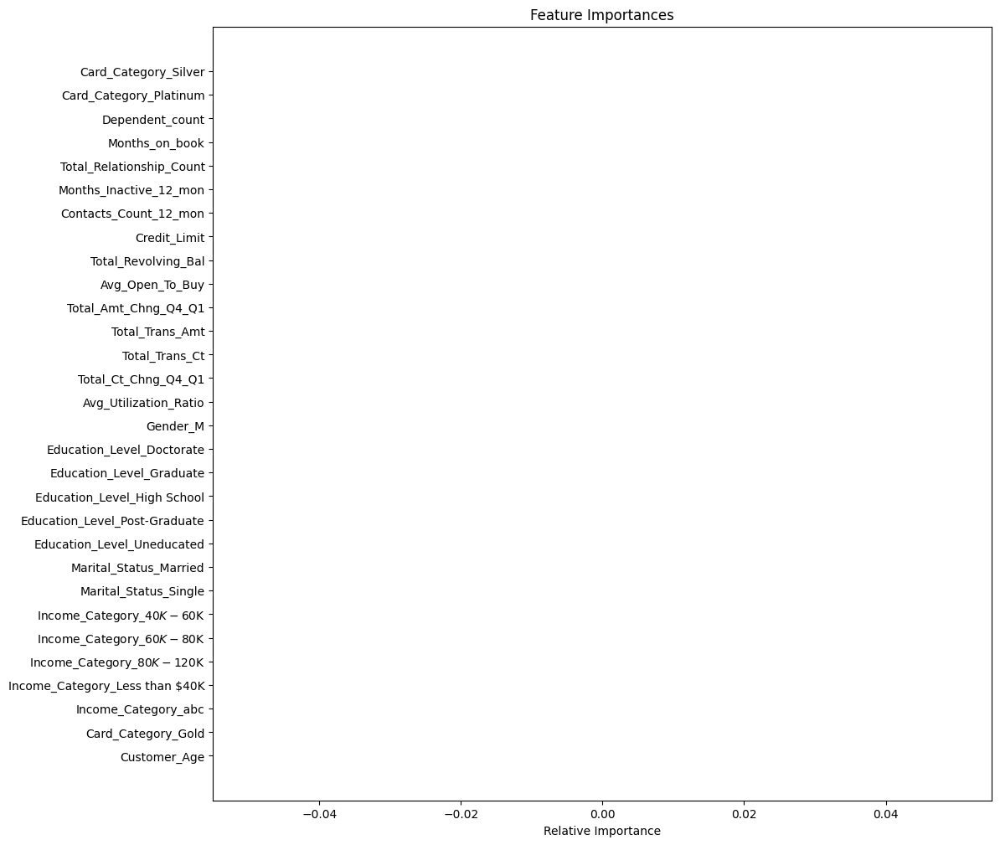

In [ ]:
feature_names = X_train.columns
importances = tuned_gbm_o.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

- I have no weights in any variable, which is pretty strange
- I left it in the notebook even though something is wrong to know what could happen with this, instead of taking it out
- In both models happens the same

## Second best test set final performance

In [ ]:
## Let's check the performance on test set
dtc_test = model_performance_classification_sklearn(tuned_DTC, X_test, y_test)
dtc_test

,Accuracy,Recall,Precision,F1
0,0.902,0.880,0.641,0.742


- The Decision Tree trained on original data has given 88% recall on the test set, which it's a little bit poorer than GBM, but:
- It's generalizing way better than GBM
- It's more harmonic
- It's aligned with what we attained using this model on both the training and validation datasets
- Because we have feature importances, we can give business more accurate info


### Feature Importance

In [ ]:
importances = tuned_DTC.feature_importances_
importances

array([0.        , 0.        , 0.        , 0.04241395, 0.        ,
       0.        , 0.        , 0.19329059, 0.        , 0.034137  ,
       0.17728474, 0.55287371, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ])

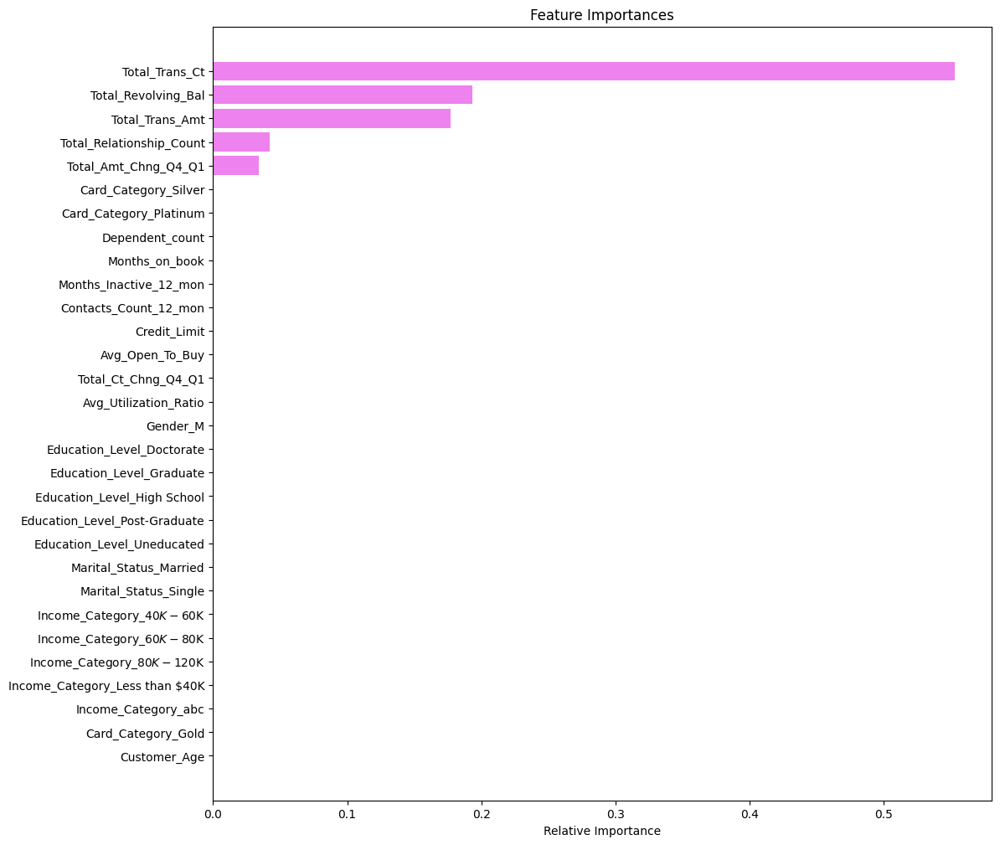

In [ ]:
feature_names = X_train.columns
importances = tuned_DTC.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

- Total Transaction Count in last 12 months helps on 55% to make predictions.
- If we add total revolving balance, total transaction amount to total transation count we reach ≈ 92% of the explanation of the attrition on the model

# Business Insights and Conclusions


- Given that 55% of customers prone to be attrited is explained by the quantity of total transactions and there's a clear pattern on customers under 70 transactions, we highly recomend to track this metric, and incentivate the customers under this number to use it to generate more engagement

- Customers under 1300 on total revolving balance should be monitored

- Customers who have a total of total transacion amount under 10,000 have to be tracked, specially the ones under 4,000, who are the most likely to be attrited

- Customers with fewer quantity of product holding are prone to be attrited

- Count of Change in Transaction of customers who are under 0.6 also are  the ones to be followed, in order to avoid attrition

- We recommend to build an attrition index helped with our ML model which gives weights to this five variables in order to track potential clients who want to unsubscribe